#**ACTIVE REGION AND FLARE DETECTION WITH CONVOLUTIONAL NEURAL NETWORK**

The purpose of this project is to automatize the observation and the detection of solar flares from raw images available online.

# **1. Install & importing Modules and Libraries:**
---







In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
pip install ann_visualizer

  Preparing metadata (setup.py) ... done
  Created wheel for ann_visualizer: filename=ann_visualizer-2.5-py3-none-any.whl size=4168 sha256=6a11bd77e45a138f969752c6e1624d76f0fe578422b4a9555d364d7fdc49228d
  Stored in directory: /root/.cache/pip/wheels/6e/0f/ae/f5dba91db71b1b32bf03d0ad18c32e86126093aba5ec6b6488
Successfully built ann_visualizer


In [ ]:
%%shell
# Ubuntu no longer distributes chromium-browser outside of snap
# Proposed solution: https://askubuntu.com/questions/1204571/how-to-install-chromium-without-snap

# Add debian buster
cat > /etc/apt/sources.list.d/debian.list <<'EOF'
deb [arch=amd64 signed-by=/usr/share/keyrings/debian-buster.gpg] http://deb.debian.org/debian buster main
deb [arch=amd64 signed-by=/usr/share/keyrings/debian-buster-updates.gpg] http://deb.debian.org/debian buster-updates main
deb [arch=amd64 signed-by=/usr/share/keyrings/debian-security-buster.gpg] http://deb.debian.org/debian-security buster/updates main
EOF

# Add keys
apt-key adv --keyserver keyserver.ubuntu.com --recv-keys DCC9EFBF77E11517
apt-key adv --keyserver keyserver.ubuntu.com --recv-keys 648ACFD622F3D138
apt-key adv --keyserver keyserver.ubuntu.com --recv-keys 112695A0E562B32A

apt-key export 77E11517 | gpg --dearmour -o /usr/share/keyrings/debian-buster.gpg
apt-key export 22F3D138 | gpg --dearmour -o /usr/share/keyrings/debian-buster-updates.gpg
apt-key export E562B32A | gpg --dearmour -o /usr/share/keyrings/debian-security-buster.gpg

# Prefer debian repo for chromium* packages only
# Note the double-blank lines between entries
cat > /etc/apt/preferences.d/chromium.pref << 'EOF'
Package: *
Pin: release a=eoan
Pin-Priority: 500


Package: *
Pin: origin "deb.debian.org"
Pin-Priority: 300


Package: chromium*
Pin: origin "deb.debian.org"
Pin-Priority: 700
EOF

# Install chromium and chromium-driver
apt-get update
apt-get install chromium chromium-driver
apt-get install -y xvfb

# Install selenium
pip install selenium==4.12.0
pip install outcome==1.2.0
pip install trio-websocket==0.10.4
pip install undetected-chromedriver
pip install PyVirtualDisplay

Executing: /tmp/apt-key-gpghome.j2IGjhV2dT/gpg.1.sh --keyserver keyserver.ubuntu.com --recv-keys DCC9EFBF77E11517
gpg: key DCC9EFBF77E11517: public key "Debian Stable Release Key (10/buster) <debian-release@lists.debian.org>" imported
gpg: Total number processed: 1
gpg:               imported: 1
Executing: /tmp/apt-key-gpghome.J7xJgr3IEy/gpg.1.sh --keyserver keyserver.ubuntu.com --recv-keys 648ACFD622F3D138
gpg: key DC30D7C23CBBABEE: public key "Debian Archive Automatic Signing Key (10/buster) <ftpmaster@debian.org>" imported
gpg: Total number processed: 1
gpg:               imported: 1
Executing: /tmp/apt-key-gpghome.3Vy7PkElHa/gpg.1.sh --keyserver keyserver.ubuntu.com --recv-keys 112695A0E562B32A
gpg: key 4DFAB270CAA96DFA: public key "Debian Security Archive Automatic Signing Key (10/buster) <ftpmaster@debian.org>" imported
gpg: Total number processed: 1
gpg:               imported: 1
Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:2 https://d

In [ ]:
!apt-get update
!apt-get install -y unzip xvfb libxi6 libgconf-2-4
!wget https://dl.google.com/linux/direct/google-chrome-stable_current_amd64.deb
!dpkg -i google-chrome-stable_current_amd64.deb
!apt --fix-broken install
!apt-get install -y chromium-chromedriver

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 http://deb.debian.org/debian buster InRelease
Hit:3 http://deb.debian.org/debian buster-updates InRelease
Hit:4 http://deb.debian.org/debian-security buster/updates InRelease
Hit:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:6 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:8 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:9 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:10 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:12 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:13 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
Reading package lists... Done
Building dependency t

In [ ]:
import undetected_chromedriver as uc

from pyvirtualdisplay import Display
display = Display(visible=0, size=(800, 600))
display.start()

options = uc.ChromeOptions()
options.add_argument('--headless')
options.add_argument('--no-sandbox')
options.add_argument('--disable-dev-shm-usage')
driver = uc.Chrome(options=options) #KALO GAJALAN KELUARIN TAB GCOLABS, BUKA BARU lagi!

In [ ]:
import sys
sys.path.insert(0,'/usr/lib/chromium-browser/chromedriver')
from selenium import webdriver
import os
import shutil

file_path = '/usr/bin/chromedriver'  # Gantilah dengan path lengkap ke file chromedriver

# Memastikan file ada sebelum menghapusnya
if os.path.exists(file_path):
    os.remove(file_path)
    print(f"File {file_path} berhasil dihapus.")
else:
    print(f"File {file_path} tidak ditemukan.")


source_path = '/content/drive/MyDrive/Colab Notebook TA/chromedriver'  # Gantilah dengan path lengkap ke chromedriver yang akan diduplikat
destination_path = '/usr/bin'  # Gantilah dengan path lengkap ke lokasi tujuan di direktori "bin"

# Mengambil nama file dari path sumber
file_name = os.path.basename(source_path)

# Membentuk path lengkap untuk file di lokasi tujuan
destination_file_path = os.path.join(destination_path, file_name)

try:
    # Melakukan duplikasi file ke lokasi tujuan
    shutil.copy(source_path, destination_file_path)
    print(f"File {file_name} berhasil diduplikat ke {destination_path}.")
except FileNotFoundError:
    print(f"Error: File {source_path} tidak ditemukan.")
except PermissionError:
    print(f"Error: Tidak memiliki izin untuk menyalin file ke {destination_path}.")
except Exception as e:
    print(f"Error: {e}")

File /usr/bin/chromedriver berhasil dihapus.
File chromedriver berhasil diduplikat ke /usr/bin.


In [ ]:
import keras
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import requests
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
#from keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import save_img
from tensorflow.keras.preprocessing.image import img_to_array
import os
import numpy as np
from PIL import Image
import random
import math
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import re
from bs4 import BeautifulSoup

def atoi(text):
    return int(text) if text.isdigit() else text

def natural_keys(text):
    '''
    alist.sort(key=natural_keys) sorts in human order
    http://nedbatchelder.com/blog/200712/human_sorting.html
  (See Toothy's implementation in the comments)
   '''
    return [ atoi(c) for c in re.split(r'(\d+)', text) ]
from keras.optimizers import SGD


In [ ]:
from selenium import webdriver
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.layers import Dropout
from nltk.tokenize import sent_tokenize, word_tokenize
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
import time
import os
from ann_visualizer.visualize import ann_viz


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm
import math
plt.style.use('fivethirtyeight')
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.serif'] = 'Ubuntu'
plt.rcParams['font.monospace'] = 'Ubuntu Mono'
plt.rcParams['font.size'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['legend.fontsize'] = 12
plt.rcParams['figure.titlesize'] = 12
plt.rcParams['image.cmap'] = 'jet'
plt.rcParams['image.interpolation'] = 'none'
plt.rcParams['figure.figsize'] = (16, 8)
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.markersize'] = 8
colors = ['xkcd:pale orange', 'xkcd:sea blue', 'xkcd:pale red', 'xkcd:sage green', 'xkcd:terra cotta', 'xkcd:dull purple', 'xkcd:teal', 'xkcd: goldenrod', 'xkcd:cadet blue',
'xkcd:scarlet']
cmap_big = cm.get_cmap('Spectral', 512)
cmap = mcolors.ListedColormap(cmap_big(np.linspace(0.7, 0.95, 256)))
bbox_props = dict(boxstyle="round,pad=0.3", fc=colors[0], alpha=.5)

<ipython-input-16-379603c362ad>:24: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_big = cm.get_cmap('Spectral', 512)


In [ ]:
!pip install webdriver_manager

# **2. Data Extraction and Exploration**
---


As it has already been said, data are available in an open source manner. Nevertheless, it has been necessary to use some scraping techniques to automatize data extraction and labelling.

Data have been extracted from the two following sources:
* https://www.spaceweatherlive.com/ - An online site that, day by day, furnishes a report of the solar activiy
* https://ftp.bbso.njit.edu/pub/archive/ - An online archive that, day by day, furnishes periodically scanned image of the sun (Active Region)
* https://sdo.gsfc.nasa.gov/assets/img/browse/ - An online archive that, day by day, furnishes periodically scanned image of the sun (Flare)

The first step is based on detecting the full calendar of solar flares, 2018 until 2023 calendars have been obtained from __Space Weather__.
In the following lines, the working code for year: xxxx have been displayed.

In [ ]:
year=2023
MONTHS=[]
months_number=[]
for i in range(1,13):
    if i<10:
        MONTHS.append('0%s/'%(i))
        months_number.append('0'+str(i))
    else:
        MONTHS.append('%s/'%(i))
        months_number.append(str(i))
twentyeight_day=[]
twentyeight_day_number=[]
for i in range(1,29):
    if i<10:
        twentyeight_day_number.append('0'+str(i))
        twentyeight_day.append('0%s/'%(i))
    else:
        twentyeight_day_number.append(str(i))
        twentyeight_day.append('%s/'%(i))
thirty_day=[]
thirty_day_number=[]
for i in range(1,31):

    if i<10:
        thirty_day.append('0%s/'%(i))
        thirty_day_number.append('0'+str(i))
    else:
        thirty_day.append('%s/'%(i))
        thirty_day_number.append(str(i))
thirtyone_day=[]
thirtyone_day_number=[]
for i in range(1,32):
    if i<10:
        thirtyone_day.append('0%s/'%(i))
        thirtyone_day_number.append('0'+str(i))
    else:
        thirtyone_day.append('%s/'%(i))
        thirtyone_day_number.append(str(i))
DAYS=[thirtyone_day,twentyeight_day,thirtyone_day,thirty_day,thirtyone_day,thirty_day,thirtyone_day,thirtyone_day,thirty_day,
     thirtyone_day,thirty_day,thirtyone_day]
DAYS_NUMBER=[thirtyone_day_number,twentyeight_day_number,thirtyone_day_number,thirty_day_number,thirtyone_day_number,thirty_day_number,thirtyone_day_number,thirtyone_day_number,thirty_day_number,
     thirtyone_day_number,thirty_day_number,thirtyone_day_number]

##**2.1. Solar Activity Data**

The following step is collective solar activity data from the site: **spaceweatherlive**

In [ ]:
import time
from selenium.common.exceptions import TimeoutException
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC

from selenium import webdriver
from selenium.common.exceptions import WebDriverException
import undetected_chromedriver as uc
from pyvirtualdisplay import Display
display = Display(visible=0, size=(800, 600))
display.start()

options = uc.ChromeOptions()
options.add_argument('--headless')
options.add_argument('--no-sandbox')
options.add_argument('--disable-dev-shm-usage')
driver = uc.Chrome(options=options)

url = "https://www.spaceweatherlive.com/en/archive/2023/01/01/xray"

PRODUCT_ID = 'Archive_SolarFlare_table'
CONTENT=[]
driver = uc.Chrome()
driver.get(url)
print(driver.title)
#time.sleep(4)
content=driver.find_element(by=By.XPATH, value='//*[@id="Archive_SolarFlare_table"]').text
#content=driver.find_element('//*[@id="Archive_SolarFlare_table"]/table[2]').text

CONTENT.append(content)
for i in range(len(months_number)):
    for j in range(len(DAYS_NUMBER[i])):
        #driver = webdriver.Chrome(options=options)

        from selenium.webdriver.chrome.options import Options
        options = Options()
        options.add_argument('--disable-blink-features=AutomationControlled')

        from selenium import webdriver
        options = uc.ChromeOptions()
        options.add_argument('--headless')
        options.add_argument('--no-sandbox')
        options.add_argument('--disable-dev-shm-usage')
        driver = webdriver.Chrome(options=options)
        driver = uc.Chrome()
        driver.get('https://www.spaceweatherlive.com/en/archive/2023/'+months_number[i]+'/'+DAYS_NUMBER[i][j]+'/'+'xray')
        element = WebDriverWait(driver, 10).until(EC.presence_of_element_located((By.ID, 'Archive_SolarFlare_table')))

        content=driver.find_element(by=By.ID,value=PRODUCT_ID).text

        #time.sleep(4)
        CONTENT.append(content)
        print('Scraping done for %s/%s/%s'%(year,months_number[i],DAYS_NUMBER[i][j]))

        driver.quit()

In [ ]:
# Membuka atau membuat berkas untuk menyimpan hasil scraping
with open('scraped_data2023.txt', 'w', encoding='utf-8') as file:
    # Menyimpan setiap elemen dalam CONTENT ke dalam berkas
    for item in CONTENT:
        file.write(item + '\n\n')  # Tambahkan newline ganda untuk memisahkan setiap elemen

print('Data hasil scraping telah disimpan dalam "scraped_data2023.txt"')

Data hasil scraping telah disimpan dalam "scraped_data2023.txt"


In [ ]:
# Membaca isi berkas teks
with open('/content/drive/MyDrive/Colab Notebook TA/scraped_data2023.txt', 'r', encoding='utf-8') as file:
    data_string = file.read()

# Memisahkan teks menjadi blok-blok teks berdasarkan newline ganda
CONTENTS = data_string.split('\n\n')
# Sekarang, data_list berisi blok-blok teks yang sesuai dengan format yang diinginkan

# Membaca data dari data_list
#for block in CONTENTS:
   # print(block)  # Anda dapat melakukan tindakan sesuai kebutuhan di sini
year=2023

The security system of the site I was scraping blocked me, so I was obliged to use the same script on another jupyter notebook, the result has been stored in the following list:

In [ ]:
del CONTENTS[0] #JALANKAN SEKALI SAJA!

In [ ]:
del CONTENTS[365] #JALANKAN SEKALI SAJA! KHUSUS SCRAPING TERSIMPAN DALAM FILE

In [ ]:
f = open("solarflarecalendar.txt", "a")
for c in CONTENTS:
    f.write(c)
f.close()

In [ ]:
import nltk
nltk.download('punkt')

TOK_CONTENT=[]
for c in CONTENTS:
    TOK_CONTENT.append((word_tokenize(str(c)))) #pisah kata

NEW_TOK_CONTENT=[]
for data in TOK_CONTENT:
    try:
        start=data.index('End') #hapus data sebagian sebelum 'End' columns
        new_data=[]
        for i in range(start+1,len(data)):
            new_data.append(data[i])
        NEW_TOK_CONTENT.append(new_data) #data baru: yg udh dihapus sebagian
    except:
        NEW_TOK_CONTENT.append(['Not available']) #sisa data yg ga ditake dijadiin 'Not Available'

print(TOK_CONTENT)
print(NEW_TOK_CONTENT)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


[['Sunspot', 'number', 'New', 'regions', 'Background', 'flux', 'Maximum', 'flux', 'C', '94', '12', '1', '1', 'B8.98', 'C3.79', '9', 'Solar', 'flares', 'Region', 'Start', 'Maximum', 'End', '3176', 'C1.6', '00:30', '00:35', '00:41', '3176', 'C3.8', '02:04', '02:29', '02:41', '3180', 'C1.7', '06:56', '07:02', '07:06', '3180', 'C1.9', '07:35', '07:44', '07:50', '3177', 'C1.7', '14:16', '14:30', '14:35', '-', 'C1.9', '17:43', '17:52', '18:09', '-', 'C1.1', '19:31', '19:35', '19:43', '-', 'C1.1', '22:09', '22:16', '22:25', '3176', 'C3.1', '22:51', '23:16', '23:26'], ['Sunspot', 'number', 'New', 'regions', 'Background', 'flux', 'Maximum', 'flux', 'C', '94', '0', '-1', 'B6.63', 'C9.44', '9', 'Solar', 'flares', 'Region', 'Start', 'Maximum', 'End', '3180', 'C1.6', '05:22', '05:29', '05:37', '3176', 'C9.5', '06:09', '06:21', '06:27', '3180', 'C2.8', '09:44', '09:56', '10:07', '3180', 'C2.3', '11:28', '11:39', '11:41', '3180', 'C3', '11:41', '11:52', '12:08', '3180', 'C1.2', '16:01', '16:08', '16:

In [ ]:
def isSolarFlare(event_list):
    issolarflare=[]
    for e in event_list:
        if e[0]=='None' or e[0]=='Not available': #"None" & "Not Available" diganti jadi "0"
            issolarflare.append(0)
        else:
            issolarflare.append(1) #selain itu diganti jd "1"


    return issolarflare

In [ ]:
month_data=[]
for i in range(len(DAYS_NUMBER)):
    for j in range(len(DAYS_NUMBER[i])):
        month_data.append('%s'%(i+1)) #hari pertama tiap bulan dihapus

In [ ]:
day_data=[]
for i in range(len(DAYS_NUMBER)): #jmlah hari di awal
    for j in range(len(DAYS_NUMBER[i])):
        day_data.append(DAYS_NUMBER[i][j])

In [ ]:
date=[]
for m in range(len(months_number)): #jmlh bulan di awal
    for d in range(len(DAYS_NUMBER[m])):
        date.append('2023'+'/'+ months_number[m]+ '/' + DAYS_NUMBER[m][d])

In [ ]:
label_data=pd.DataFrame()
label_data['Date']=date
label_data['Month']=month_data
label_data['Day']=day_data
label_data['Solar Flare Event']=isSolarFlare(NEW_TOK_CONTENT) #bikin tabel kapan aja terjadi solar flare

In [ ]:
label_data

,Date,Month,Day,Solar Flare Event
0,2023/01/01,1,01,1
1,2023/01/02,1,02,1
2,2023/01/03,1,03,1
3,2023/01/04,1,04,1
4,2023/01/05,1,05,1
...,...,...,...,...
360,2023/12/27,12,27,1
361,2023/12/28,12,28,1
362,2023/12/29,12,29,1
363,2023/12/30,12,30,1


In this way we know if we have or not a Solar Flare on that day of 2023.

In [ ]:
label_data.to_csv('Solarflarevent.csv')

In [ ]:
solarflares=label_data[label_data['Solar Flare Event']==1].index.tolist() #ambil dari data kejadian solar flare tp yg terjadi aja alias "1"
SOLAR_FLARE_TOK=[]
for i in solarflares:
    SOLAR_FLARE_TOK.append(NEW_TOK_CONTENT[i]) #ambil data tabel NEW_TOK_CONTENT tapi yang ada kejadian solar flare aj alias "1"

In [ ]:
#SOLAR_FLARE_TOK

In [ ]:
#ambil data dari SOLAR_FLARE_TOK tapi jamnya aja  (start,peak,end) terjadinya solar flare
SOLAR_FLARE_H=[]

for event in SOLAR_FLARE_TOK:
    hour_day=[]
    for element in event:
        hour=[]
        for character in element:
            if character==':':
                hour.append(element)
        hour_day.append(hour)
    SOLAR_FLARE_H.append(hour_day)

In [ ]:
#menhapus array kosong
NEW_SOLAR_FLARE_H=[]
for event in SOLAR_FLARE_H:
    flat_list = [item for sublist in event for item in sublist]
    NEW_SOLAR_FLARE_H.append(flat_list)

In [ ]:
#jumlah kejadian solar flare per harinya
how_many=[]
for day in NEW_SOLAR_FLARE_H:
    how_many.append(int(len(day)/3))

In [ ]:
date=[]
for m in range(len(months_number)):
    for d in range(len(DAYS_NUMBER[m])):
        date.append('2023'+'/'+ months_number[m]+ '/' + DAYS_NUMBER[m][d])

In [ ]:
solarflare_date=label_data[label_data['Solar Flare Event']==1].Date.tolist()#ambil data kejadian solar flare tp cuma yg terjadi alias "1"
new_solar_flare_date=[]
for h in range(len(how_many)):
    for i in range(how_many[h]):
        new_solar_flare_date.append(solarflare_date[h]) #penanggalan solar flare yg trjadi

In [ ]:
new_solar_flare_date

In [ ]:
label_detailed_data=pd.DataFrame()
label_detailed_data['Date']=new_solar_flare_date #bikin kolom buat tanggal terjadinya solar flare (ada penanggalann yg sama krn terjadi multi solar flare)

In [ ]:
def chunkIt(seq, num):
    avg = len(seq) / float(num) #rata2 panjang chunk
    out = []
    last = 0.0

    while last < len(seq):
        out.append(seq[int(last):int(last + avg)])
        last += avg

    return out

In [ ]:
FINAL_SOLAR_FLARE_H=[]
for i in range(len(NEW_SOLAR_FLARE_H)):
    FINAL_SOLAR_FLARE_H.append(chunkIt(NEW_SOLAR_FLARE_H[i],how_many[i])) #jumlah solar flare yg terjadi dipisah per tiap day

In [ ]:
#FINAL_SOLAR_FLARE_H

In [ ]:
#dijadikan ke tabel
START=[]
PEAK=[]
END=[]
for i in range(len(FINAL_SOLAR_FLARE_H)):
    for j in range(len(FINAL_SOLAR_FLARE_H[i])):
        START.append(FINAL_SOLAR_FLARE_H[i][j][0])
        PEAK.append(FINAL_SOLAR_FLARE_H[i][j][1])
        END.append(FINAL_SOLAR_FLARE_H[i][j][2])

In [ ]:
label_detailed_data['Start']=START
label_detailed_data['Maximum']=PEAK
label_detailed_data['End']=END

In [ ]:
label_detailed_data.to_csv('SolarFlareDetailedData2023.csv')

The full calendar of Solar Flare in 2023 has been collected in the following DataFrame:



In [ ]:
label_detailed_data

,Date,Start,Maximum,End
0,2023/01/01,00:30,00:35,00:41
1,2023/01/01,02:04,02:29,02:41
2,2023/01/01,06:56,07:02,07:06
3,2023/01/01,07:35,07:44,07:50
4,2023/01/01,14:16,14:30,14:35
...,...,...,...,...
3387,2023/12/31,17:38,17:46,17:51
3388,2023/12/31,18:02,18:16,18:28
3389,2023/12/31,18:28,18:39,18:44
3390,2023/12/31,18:44,19:12,19:40


In [ ]:
stop()

NameError: name 'stop' is not defined

##**2.2. Active Region Available Data**

The following step is based on checking which Active Region image is available from the site: **BBSO (Big Bear Solar Observatory)**




In [ ]:
web_url='https://sdo.gsfc.nasa.gov/assets/img/browse/'
research_date=label_detailed_data.Date.drop_duplicates().tolist()#hapus duplikasi

In [ ]:
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.common.exceptions import NoSuchElementException

options = webdriver.ChromeOptions()
options.add_argument('--headless')
options.add_argument('--no-sandbox')
options.add_argument('--disable-dev-shm-usage')

HOUR_TOK = []
for j in range(len(research_date)):

    try:
        TAKE=[]
        print(web_url + research_date[j])
        print('Scraping done for %s, another %i day missing' % (research_date[j], len(research_date) - (j + 1)))

        driver = webdriver.Chrome(options=options)
        driver.get(web_url + research_date[j])

        # Cari elemen teks berdasarkan XPath
        body_element = driver.find_elements(By.TAG_NAME, 'body')

        if len(body_element) > 0:
            yaye_elements = driver.find_elements(By.PARTIAL_LINK_TEXT, "512_HMIB.jpg")

            for element in yaye_elements:
                yaye_text = element.text
                #print(yaye_text)

                LIST = yaye_text.split('_')
                TAKE.append(LIST[1])
            HOUR_TOK.append(TAKE)

        else:
            print("Body element not found.")

    except Exception as e:
        print("Error:", str(e))
        TOT_TIME_TOK.append(['Not available'])
        continue

    finally:
       driver.quit()


In [ ]:
stop()

BATAS
---

In [ ]:
web_url='http://ftp.bbso.njit.edu/pub/archive/'
research_date=label_detailed_data.Date.drop_duplicates().tolist()#hapus duplikasi

In [ ]:
from selenium import webdriver
options = webdriver.ChromeOptions()
options.add_argument('--headless')
options.add_argument('--no-sandbox')
options.add_argument('--disable-dev-shm-usage')
driver = webdriver.Chrome(options=options)
options.add_argument('--ignore-certificate-errors') #gunakan jika "privacy error"
from selenium.common.exceptions import NoSuchElementException

HOUR_TOK = []

TOKS=None
TOT_TIME_TOK=[]
for j in range(len(research_date)):
  try:
    print(web_url+research_date[j])
    #driver=webdriver.Chrome(path)
    print('Scraping done for %s , another %i day missing' %(research_date[j],len(research_date)-(j+1)))

    from selenium import webdriver
    options = webdriver.ChromeOptions()
    options.add_argument('--headless')
    options.add_argument('--no-sandbox')
    options.add_argument('--disable-dev-shm-usage')
    driver = webdriver.Chrome(options=options)
    from selenium.common.exceptions import NoSuchElementException

    driver.get(web_url+research_date[j])

    try:
      # Cari elemen teks berdasarkan XPath
      text = driver.find_element(By.XPATH, '/html/body/center/p[4]/table/tbody').text

      NEW_TOK = word_tokenize(text)

      for i in range(len(NEW_TOK)):
        LIST = NEW_TOK[i].split('_')
        HOUR_TOK.append(LIST[1])

    except NoSuchElementException:
      try:
        #jika ada text Daily Images from Global Halpha Network maka elemen di page tidak ada
        if driver.find_element(By.LINK_TEXT,'GONG Full Disk Magnetograms').text:
          text = driver.find_element(By.XPATH, '/html/body/center/p[2]/table/tbody').text

          NEW_TOK = word_tokenize(text)

          for i in range(len(NEW_TOK)):
              LIST = NEW_TOK[i].split('_')
              HOUR_TOK.append(LIST[1])

      except NoSuchElementException:
        try:
            if driver.find_elements(By.TAG_NAME, "tbody"):
               yaye=driver.find_elements(By.PARTIAL_LINK_TEXT, "gong_magxx")

            for element in yaye:
                  indx = element.get_attribute("href")
                  start_indx = indx.rfind('_') + 1
                  end_indx = indx.find('.', start_indx)
                  cobs = indx[start_indx:end_indx]
                  HOUR_TOK.append(cobs)
                  print(cobs)

        except NoSuchElementException:
           raise Exception("Both XPaths failed to find the element")

  except Exception as e:
    print("Error:", str(e))
    TOT_TIME_TOK.append(['Not available'])
    continue

TIME_TOK = []
sep = ':'
for i in range(len(HOUR_TOK)):
  hour = HOUR_TOK[i][0] + HOUR_TOK[i][1]
  minutes = HOUR_TOK[i][2] + HOUR_TOK[i][3]
  TIME_TOK.append(hour + sep + minutes)

  TOT_TIME_TOK.append(TIME_TOK)

# Tutup WebDriver setelah selesai
driver.quit()


# TOT_TIME_TOK sekarang berisi data yang telah diekstrak
print("TOT_TIME_TOK:", TOT_TIME_TOK)

In [ ]:
TOT_TIME_TOK

In [ ]:
#membuat list baru pada ["Not Available"]
for i in range(len(TOT_TIME_TOK)):
    try:
        inde=TOT_TIME_TOK.index('Not available')
        TOT_TIME_TOK[inde]=['Not available']
    except:
        break

In [ ]:
for i in range(len(TOT_TIME_TOK)):
    if len(TOT_TIME_TOK[i])==0:
        TOT_TIME_TOK[i]=['Not available']

In [ ]:
def datetominute(date):
    try:
        hour=int(date[0]+date[1])
        min_hour=hour*60
        tot_min=min_hour+int(date[3]+date[4])
    except:
        tot_min='Not available'
    return tot_min

In [ ]:
#konversi waktu dalam format 'HH:MM' menjadi jumlah menit
MIN_TO_TIME_TOK=[]
for day in TOT_TIME_TOK:
    min_day=[]
    for hour in day:
        min_hour=datetominute(hour)
        min_day.append(min_hour)
    MIN_TO_TIME_TOK.append(min_day)

In [ ]:
label_detailed_data

In [ ]:
how_many=label_detailed_data.groupby('Date').count().Start.tolist() #itung data dlm "Date" yang sama (n) diisi ke "Start"

In [ ]:
how_many

In [ ]:
REPEAT_TOT_TIME_TOK = []

for i in range(len(how_many)):
    # Pastikan indeks i valid untuk MIN_TO_TIME_TOK
    if i < len(MIN_TO_TIME_TOK):
        for j in range(how_many[i]):
            # Pastikan MIN_TO_TIME_TOK[i] berisi elemen yang dapat diulang
            if isinstance(MIN_TO_TIME_TOK[i], (list, tuple)):
                REPEAT_TOT_TIME_TOK.append(MIN_TO_TIME_TOK[i])
            else:
                # Alternatif: Tambahkan elemen ke dalam list baru
                REPEAT_TOT_TIME_TOK.append([MIN_TO_TIME_TOK[i]])
    else:
        print(f"Warning: Index {i} out of range for MIN_TO_TIME_TOK")

# Tampilkan hasil
print("REPEAT_TOT_TIME_TOK:", REPEAT_TOT_TIME_TOK)


In [ ]:
REPEAT_TOT_TIME_TOK=[]
for i in range(len(how_many)):
    for j in range(how_many[i]):
        REPEAT_TOT_TIME_TOK.append(MIN_TO_TIME_TOK[i]) #tambah menit ke data yg udh dikelompokin by "Date"

In [ ]:
minute_labeled_data=label_detailed_data

In [ ]:
Start_minute=[]
Peak_minute=[]
End_minute=[]

Start_normal=minute_labeled_data['Start'].tolist()
Peak_normal=minute_labeled_data['Maximum'].tolist()
End_normal=minute_labeled_data['End'].tolist()


for s in range(len(Start_normal)):
    Start_minute.append(datetominute(str(Start_normal[s])))
    Peak_minute.append(datetominute(str(Peak_normal[s])))
    End_minute.append(datetominute(str(End_normal[s])))

In [ ]:
minute_labeled_data['Start']=Start_minute
minute_labeled_data['Maximum']=Peak_minute
minute_labeled_data['End']=End_minute

In [ ]:
#minute_labeled_data

In [ ]:
minute_labeled_data.to_csv('SolarFlareDetailedDataMinute2023.csv')

In [ ]:
repeat_TOT_TIME_TOK=[]
for i in range(len(how_many)):
    for j in range(how_many[i]):
        repeat_TOT_TIME_TOK.append(TOT_TIME_TOK[i])

In [ ]:
print(repeat_TOT_TIME_TOK)

In [ ]:
AVAILABLE=[]
TOT_DATA=[]
TOT_HOUR_DATA=[]
for i in range(len(minute_labeled_data)):
    start=minute_labeled_data.Start.loc[i]
    end=minute_labeled_data.End.loc[i]
    count=0
    DATA=[]
    HOUR_DATA=[]
    for j in range(len(REPEAT_TOT_TIME_TOK[i])):
        data=REPEAT_TOT_TIME_TOK[i][j]
        hour_data=repeat_TOT_TIME_TOK[i][j]
        if data=='Not available':
            continue
        else:
            data=int(data)

            if data>=int(start) and data<=int(end):
                count=count+1
                DATA.append(data)
                HOUR_DATA.append(hour_data)
    if count==0:
        AVAILABLE.append('No')
        TOT_DATA.append('-')
        TOT_HOUR_DATA.append('-')
    else:
        AVAILABLE.append('Yes')
        TOT_DATA.append(DATA[0])
        TOT_HOUR_DATA.append(HOUR_DATA[0])

'''
mengumpulkan data tentang ketersediaan ('Yes' atau 'No'), nilai pertama dalam DATA,
dan nilai pertama dalam HOUR_DATA untuk setiap elemen dalam list minute_labeled_data,
berdasarkan rentang waktu yang ditentukan oleh start dan end.
'''

In [ ]:
label_detailed_data=pd.read_csv('SolarFlareDetailedData.csv').drop(columns=['Unnamed: 0'])
label_detailed_data['Available']=AVAILABLE
label_detailed_data['Data']=TOT_HOUR_DATA

In [ ]:
label_detailed_data[label_detailed_data['Available']=='Yes'].to_csv('Availabledata2023.csv')

##**2.3. Flare Available Data**

The following step is based on checking which Flare image is available from the site:
**SDO (Solar Dynamics Observatory)**



In [ ]:
web_url='https://sdo.gsfc.nasa.gov/assets/img/browse/'
research_date=label_detailed_data.Date.drop_duplicates().tolist()#hapus duplikasi

In [ ]:
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.common.exceptions import NoSuchElementException

options = webdriver.ChromeOptions()
options.add_argument('--headless')
options.add_argument('--no-sandbox')
options.add_argument('--disable-dev-shm-usage')

HOUR_TOK = []
for j in range(len(research_date)):

    try:
        TAKE=[]
        print(web_url + research_date[j])
        print('Scraping done for %s, another %i day missing' % (research_date[j], len(research_date) - (j + 1)))

        driver = webdriver.Chrome(options=options)
        driver.get(web_url + research_date[j])

        # Cari elemen teks berdasarkan XPath
        body_element = driver.find_elements(By.TAG_NAME, 'body')

        if len(body_element) > 0:
            yaye_elements = driver.find_elements(By.PARTIAL_LINK_TEXT, "512_0131.jpg")

            for element in yaye_elements:
                yaye_text = element.text
                #print(yaye_text)

                LIST = yaye_text.split('_')
                TAKE.append(LIST[1])
            HOUR_TOK.append(TAKE)

        else:
            print("Body element not found.")

    except Exception as e:
        print("Error:", str(e))
        TOT_TIME_TOK.append(['Not available'])
        continue

    finally:
       driver.quit()


LANJUT SINI KALAU DARI SDO(setelah scrap available data ar DAN fLARE SAMA AJA)
---

In [ ]:
# Processing the extracted data
TOT_TIME_TOK=[]
sep = ':'
for j in range(len(HOUR_TOK)):
    TAKES=[]
    TIME_TOK = []
    for i in range(len(HOUR_TOK[j])):
        hour = HOUR_TOK[j][i][0] + HOUR_TOK[j][i][1]
        minutes = HOUR_TOK[j][i][2] + HOUR_TOK[j][i][3]
        TAKES.append(hour + sep + minutes)
    TOT_TIME_TOK.append(TAKES)

#TOT_TIME_TOK.append(TIME_TOK)

# TOT_TIME_TOK now contains the processed data
print("TOT_TIME_TOK:", TOT_TIME_TOK)

TOT_TIME_TOK: [['00:06', '00:21', '00:36', '00:51', '01:05', '01:20', '01:35', '01:50', '02:05', '02:20', '02:34', '02:49', '03:04', '03:19', '03:34', '03:49', '04:03', '04:18', '04:33', '04:48', '05:03', '05:18', '05:32', '05:47', '06:02', '06:17', '06:32', '06:47', '07:01', '07:16', '07:31', '07:46', '08:01', '08:16', '08:30', '08:45', '09:00', '09:15', '09:30', '09:45', '09:59', '10:14', '10:29', '10:44', '10:59', '11:14', '11:28', '11:43', '11:58', '12:13', '12:28', '12:43', '12:57', '13:12', '13:27', '13:42', '13:57', '14:12', '14:26', '14:41', '14:56', '15:11', '15:26', '15:41', '15:55', '16:10', '16:25', '16:40', '16:55', '17:10', '17:24', '17:39', '17:54', '18:09', '18:24', '18:39', '18:53', '19:08', '19:23', '19:38', '19:53', '20:08', '20:22', '20:37', '20:52', '21:07', '21:22', '21:37', '21:51', '22:06', '22:21', '22:36', '22:51', '23:06', '23:20', '23:35', '23:50'], ['00:05', '00:20', '00:35', '00:49', '01:04', '01:19', '01:34', '01:49', '02:04', '02:18', '02:33', '02:48', '

In [ ]:
#membuat list baru pada ["Not Available"]
for i in range(len(TOT_TIME_TOK)):
    try:
        inde=TOT_TIME_TOK.index('Not available')
        TOT_TIME_TOK[inde]=['Not available']
    except:
        break

for i in range(len(TOT_TIME_TOK)):
    if len(TOT_TIME_TOK[i])==0:
        TOT_TIME_TOK[i]=['Not available']

In [ ]:
def datetominute(date):
    try:
        hour=int(date[0]+date[1])
        min_hour=hour*60
        tot_min=min_hour+int(date[3]+date[4])
    except:
        tot_min='Not available'
    return tot_min

In [ ]:
# Konversi waktu dalam format 'HH:MM' menjadi jumlah menit
MIN_TOT_TIME_TOK = []

for day in TOT_TIME_TOK:
    min_day = []
    for hour in day:
        min_hour = datetominute(hour)
        min_day.append(min_hour)
    MIN_TOT_TIME_TOK.append(min_day)

In [ ]:
how_many=label_detailed_data.groupby('Date').count().Start.tolist() #itung data dlm "Da te" yang sama (n) diisi ke "Start"

In [ ]:
REPEAT_TOT_TIME_TOK=[]
for i in range(len(how_many)):
    for j in range(how_many[i]):
        REPEAT_TOT_TIME_TOK.append(MIN_TOT_TIME_TOK[i]) #tambah menit ke data yg udh dikelompokin by "Date"

In [ ]:
minute_labeled_data=label_detailed_data

In [ ]:
Start_minute=[]
Peak_minute=[]
End_minute=[]

Start_normal=minute_labeled_data['Start'].tolist()
Peak_normal=minute_labeled_data['Maximum'].tolist()
End_normal=minute_labeled_data['End'].tolist()

for s in range(len(Start_normal)):
    Start_minute.append(datetominute(str(Start_normal[s])))
    Peak_minute.append(datetominute(str(Peak_normal[s])))
    End_minute.append(datetominute(str(End_normal[s])))

minute_labeled_data['Start']=Start_minute
minute_labeled_data['Maximum']=Peak_minute
minute_labeled_data['End']=End_minute

minute_labeled_data.to_csv('SolarFlareDetailedDataMinute2023.csv')

In [ ]:
repeat_TOT_TIME_TOK=[]
for i in range(len(how_many)):
    for j in range(how_many[i]):
        repeat_TOT_TIME_TOK.append(TOT_TIME_TOK[i]) #tambah menit ke data yg udh dikelompokin by "Date"

Batas sebelum lanjut ke label 0
---



In [ ]:
AVAILABLE=[]
TOT_DATA=[]
TOT_HOUR_DATA=[]
for i in range(len(minute_labeled_data)):
    start=minute_labeled_data.Start.loc[i]
    end=minute_labeled_data.End.loc[i]
    count=0
    DATA=[]
    HOUR_DATA=[]
    for j in range(len(REPEAT_TOT_TIME_TOK[i])):
        data=REPEAT_TOT_TIME_TOK[i][j]
        hour_data=repeat_TOT_TIME_TOK[i][j]
        if data=='Not available':
            continue
        else:
            data=int(data)

            if data>=int(start) and data<=int(end):
                count=count+1
                DATA.append(data)
                HOUR_DATA.append(hour_data)
    if count==0:
        AVAILABLE.append('No')
        TOT_DATA.append('-')
        TOT_HOUR_DATA.append('-')
    else:
        AVAILABLE.append('Yes')
        TOT_DATA.append(DATA[0])
        TOT_HOUR_DATA.append(HOUR_DATA[0])

In [ ]:
label_detailed_data=pd.read_csv('SolarFlareDetailedData2023.csv').drop(columns=['Unnamed: 0'])
label_detailed_data['Available']=AVAILABLE
label_detailed_data['Data']=TOT_HOUR_DATA

In [ ]:
label_detailed_data[label_detailed_data['Available']=='Yes'].to_csv('FL_Flaredata2023.csv')

In [ ]:
'''
FINAL_TOK=[]
for i in range(len(NEW_TOK)):
    LIST=NEW_TOK[i].split('_')
    FINAL_TOK.append(LIST[0])
'''

In [ ]:
'''
HOUR_TOK=[]
for i in range(len(FINAL_TOK)):
    LIST=FINAL_TOK[i].split('_')
    HOUR_TOK.append(LIST[len(LIST)-1])
'''

In [ ]:
'''
TIME_TOK=[]
sep=':'
for i in range(len(HOUR_TOK)):
    hour=HOUR_TOK[i][0]+HOUR_TOK[i][1]
    minutes=HOUR_TOK[i][2]+HOUR_TOK[i][3]
    TIME_TOK.append(hour+sep+minutes)
'''

In [ ]:
stop()

scrap label 0 (Non-Flare)
---

In [ ]:
AVAILABLE=[]
TOT_DATA=[]
TOT_HOUR_DATA=[]
for i in range(len(minute_labeled_data)):
    start=minute_labeled_data.Start.loc[i]
    end=minute_labeled_data.End.loc[i]
    count=0
    DATA=[]
    HOUR_DATA=[]
    for j in range(len(REPEAT_TOT_TIME_TOK[i])):
        data=REPEAT_TOT_TIME_TOK[i][j]
        hour_data=repeat_TOT_TIME_TOK[i][j]
        if data=='Not available':
            continue
        else:
            data=int(data)

            if data<int(start) and data>int(end):
                count=count+1
                DATA.append(data)
                HOUR_DATA.append(hour_data)
    if count==0:
        AVAILABLE.append('No')
        TOT_DATA.append('-')
        TOT_HOUR_DATA.append('-')
    else:
        AVAILABLE.append('Yes')
        TOT_DATA.append(DATA[0])
        TOT_HOUR_DATA.append(HOUR_DATA[0])

In [ ]:
label_detailed_data=pd.read_csv('SolarFlareDetailedData2023.csv').drop(columns=['Unnamed: 0'])
label_detailed_data['Available']=AVAILABLE
label_detailed_data['Data']=TOT_HOUR_DATA

In [ ]:
label_detailed_data[label_detailed_data['Available']=='Yes'].to_csv('FLNon-Flaredata2023.csv')



```
`# This is formatted as code`
```

##**2.4 Collecting Complete ACTIVE REGION images from BBSO:**
---





In [ ]:
base_string='gong_magxx_fd_2023'
first_try='_182103.jpg'
second_try='_182203.jpg'
base='/pub/archive/2023/'

In [ ]:
web_urls='http://ftp.bbso.njit.edu/pub/archive/2023/'

In [ ]:
from selenium import webdriver
options = webdriver.ChromeOptions()
options.add_argument('--headless')
options.add_argument('--no-sandbox')
options.add_argument('--disable-dev-shm-usage')
options.add_argument('--ignore-certificate-errors') #gunakan jika "privacy error"
driver = webdriver.Chrome(options=options)
from selenium.common.exceptions import NoSuchElementException

file = open('datareport2023.txt','w')

for m in range(len(MONTHS)):

    from selenium import webdriver
    options = webdriver.ChromeOptions()
    options.add_argument('--headless')
    options.add_argument('--no-sandbox')
    options.add_argument('--disable-dev-shm-usage')
    driver = webdriver.Chrome(options=options)
    from selenium.common.exceptions import NoSuchElementException

    driver.get(web_urls)
    driver.find_element(By.LINK_TEXT,str(MONTHS[m])).click()

    for d in range(len(DAYS[m])):

        driver.get(web_urls+str(MONTHS[m]))
        driver.find_element(By.LINK_TEXT,str(DAYS[m][d])).click()

        file.write('-----------------------------------\n')
        file.write(DAYS[m][d]+MONTHS[m]+'2023\n')
        print('-----------------------------------\n')
        print(DAYS[m][d]+MONTHS[m]+'2023\n')



        try:
            print('Pencarian data pada pukul 18.21\n')
            file.write('Pencarian data pada pukul 18.21\n')

            options = webdriver.ChromeOptions()
            options.add_argument('--headless')
            options.add_argument('--no-sandbox')
            options.add_argument('--disable-dev-shm-usage')
            driver = webdriver.Chrome(options=options)


            driver.get(web_urls+str(MONTHS[m])+str(DAYS[m][d]))
            url=base_string + months_number[m] + DAYS_NUMBER[m][d] + first_try
            #driver.find_element(By.XPATH,'//a[@href="'+url+'"]').click()
            img=driver.find_element(By.XPATH,'//a[contains(@href,"'+url+'")]').get_attribute("href")
            file.write('Data tersedia pada pukul 18.21\n')
            print('TERSEDIA data pada pukul 18.21\n')
            print (web_urls+str(MONTHS[m])+str(DAYS[m][d]))
            print(url)

            img_data = requests.get(img).content
            with open('/content/drive/MyDrive/Colab Notebook TA/images_data2023/' + os.path.basename(url), 'wb') as handler:
                handler.write(img_data)


        except NoSuchElementException:
          try:

            # Jika elemen tidak ditemukan, cari dengan XPath alternatif
            driver.get(web_urls+str(MONTHS[m])+str(DAYS[m][d]))
            urls=base+ MONTHS[m]+DAYS[m][d] +base_string+ months_number[m] + DAYS_NUMBER[m][d]+ first_try
            img=driver.find_element(By.XPATH,'//a[@href="'+urls+'"]').get_attribute("href")
            file.write('Data tersedia pada pukul 18.21\n')
            print('TERSEDIAS data pada pukul 18.21\n')
            print(web_urls+str(MONTHS[m])+str(DAYS[m][d]))
            print(urls)

            with open('/content/drive/MyDrive/Colab Notebook TA/images_data2023/' + os.path.basename(urls), 'wb') as handler:
              handler.write(img_data)


          except NoSuchElementException:
            try:
              print('TIDAK TERSEDIA data pada pukul 18.21\n')
              file.write('Data tidak tersedia pada pukul 18.21\n')
              print('Pencarian data pada pukul 18.22\n')
              file.write('Pencarian data pada pukul 18.22\n')
              driver.get(web_urls+str(MONTHS[m])+str(DAYS[m][d]))
              url1=base_string + months_number[m] + DAYS_NUMBER[m][d]+ second_try
              #driver.find_element(By.XPATH,'//a[@href="'+url1+'"]').click()
              img=driver.find_element(By.XPATH,'//a[contains(@href,"'+url1+'")]').get_attribute("href")
              file.write('Data tersedia pada pukul 18.22\n')
              print('TERSEDIA data pada pukul 18.22\n')
              print(web_urls+str(MONTHS[m])+str(DAYS[m][d]))
              print(url1)

              img_data = requests.get(img).content
              with open('/content/drive/MyDrive/Colab Notebook TA/images_data2023/' + os.path.basename(url1), 'wb') as handler:
                handler.write(img_data)


            except NoSuchElementException:
              try:
                 driver.get(web_urls+str(MONTHS[m])+str(DAYS[m][d]))
                 urls1=base+ MONTHS[m]+DAYS[m][d] +base_string+ months_number[m] + DAYS_NUMBER[m][d] + second_try
                 img=driver.find_element(By.XPATH,'//a[@href="'+urls1+'"]').get_attribute("href")
                 file.write('Data tersedia pada pukul 18.22\n')
                 print('TERSEDIAS data pada pukul 18.22\n')
                 print(web_urls+str(MONTHS[m])+str(DAYS[m][d]))
                 print(urls1)
                 img_data = requests.get(img).content
                 with open('/content/drive/MyDrive/Colab Notebook TA/images_data2023/' + os.path.basename(urls1), 'wb') as handler:
                   handler.write(img_data)

              except NoSuchElementException:
                file.write('tidak tersedia data apapun\n')
                print('TIDAK TERSEDIA data apapun\n')


file.close()
driver.quit()

In [ ]:
stop()



```
`# This is formatted as code`
```

##**2.4 Collecting Complete ACTIVE REGION images from SDO:**
---


In [ ]:
web_urlz='https://sdo.gsfc.nasa.gov/assets/img/browse/2023/'

In [ ]:
MONTHS = [ '11/','12/']
DAYS =[
    ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/'],
        ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/', '31/']]

'''     ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/', '31/'],
        ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/','31/'],
        ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/'],
        ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/', '31/'],
        ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/'],
        ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/', '31/']]
'''

In [ ]:
from selenium import webdriver
from selenium.webdriver.common.by import By
import os
import requests

options = webdriver.ChromeOptions()
options.add_argument('--headless')
options.add_argument('--no-sandbox')
options.add_argument('--disable-dev-shm-usage')
options.add_argument('--ignore-certificate-errors')  # Use if "privacy error"
driver = webdriver.Chrome(options=options)

file = open('ARreport2023.txt', 'w')

# Initialize a counter variable
counter = 0


for m in range(len(MONTHS)):
    driver.get(web_urlz)
    driver.find_element(By.LINK_TEXT, str(MONTHS[m])).click()

    for d in range(len(DAYS[m])):
        driver.get(web_urlz + str(MONTHS[m]))
        driver.find_element(By.LINK_TEXT, str(DAYS[m][d])).click()

        file.write('-----------------------------------\n')
        file.write(DAYS[m][d] + MONTHS[m] + '2023\n')
        print('-----------------------------------\n')
        print(DAYS[m][d] + MONTHS[m] + '2023\n')

        try:
            # Reuse the existing driver instead of initializing a new one
            driver.get(web_urlz + str(MONTHS[m]) + str(DAYS[m][d]))
            print(web_urlz + str(MONTHS[m]) + str(DAYS[m][d]))

            elements = driver.find_elements(By.PARTIAL_LINK_TEXT, "512_HMIB.jpg")

            if elements:
                for element in elements:
                    img = element.get_attribute("href")
                    img_data = requests.get(img).content

                    # Check if the counter is a multiple of 4 before downloading
                    if counter==0 or counter % 54 == 0:
                        print(img, "is found")
                        file.write(img + " is found\n")
                        with open('/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 4/2023/' + os.path.basename(img), 'wb') as handler:
                            handler.write(img_data)

                    # Increment the counter
                    counter += 1

            else:
                print("image not found.")

        except Exception as e:
            print("Error:", str(e))

file.close()
driver.quit()


https://sdo.gsfc.nasa.gov/assets/img/browse/2023/11/13/20231113_230000_512_HMIB.jpg is found
-----------------------------------

14/11/2023

https://sdo.gsfc.nasa.gov/assets/img/browse/2023/11/14/
https://sdo.gsfc.nasa.gov/assets/img/browse/2023/11/14/20231114_123000_512_HMIB.jpg is found
-----------------------------------

15/11/2023

https://sdo.gsfc.nasa.gov/assets/img/browse/2023/11/15/
https://sdo.gsfc.nasa.gov/assets/img/browse/2023/11/15/20231115_020000_512_HMIB.jpg is found
https://sdo.gsfc.nasa.gov/assets/img/browse/2023/11/15/20231115_153000_512_HMIB.jpg is found
-----------------------------------

16/11/2023

https://sdo.gsfc.nasa.gov/assets/img/browse/2023/11/16/
https://sdo.gsfc.nasa.gov/assets/img/browse/2023/11/16/20231116_050000_512_HMIB.jpg is found
https://sdo.gsfc.nasa.gov/assets/img/browse/2023/11/16/20231116_183000_512_HMIB.jpg is found
-----------------------------------

17/11/2023

https://sdo.gsfc.nasa.gov/assets/img/browse/2023/11/17/
https://sdo.gsfc.nasa.

KeyboardInterrupt: 

##**2.5. Collecting complete FLARE images from SDO**




---






In [ ]:
MONTHS = [ '10/','11/','12/']
DAYS =[
        ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/', '31/'],
        ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/'],
        ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/', '31/']]

In [ ]:
web_urlz='https://sdo.gsfc.nasa.gov/assets/img/browse/2023/'

In [ ]:
from selenium import webdriver
from selenium.webdriver.common.by import By
import os
import requests

options = webdriver.ChromeOptions()
options.add_argument('--headless')
options.add_argument('--no-sandbox')
options.add_argument('--disable-dev-shm-usage')
options.add_argument('--ignore-certificate-errors')  # Use if "privacy error"
driver = webdriver.Chrome(options=options)

file = open('flarereport2023.txt', 'w')

# Initialize a counter variable
counter = 0
'''
#MONTHS = ['07/','08/','09/','10/','11/','12/']
#DAYS =[
        ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/', '31/'],
        ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/','31/'],
        ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/'],
        ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/', '31/'],
        ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/'],
        ['01/', '02/', '03/', '04/', '05/', '06/', '07/', '08/', '09/', '10/', '11/', '12/', '13/', '14/', '15/', '16/', '17/', '18/', '19/', '20/', '21/', '22/', '23/', '24/', '25/', '26/', '27/', '28/', '29/', '30/', '31/']]
'''

for m in range(len(MONTHS)):
    driver.get(web_urlz)
    driver.find_element(By.LINK_TEXT, str(MONTHS[m])).click()

    for d in range(len(DAYS[m])):
        driver.get(web_urlz + str(MONTHS[m]))
        driver.find_element(By.LINK_TEXT, str(DAYS[m][d])).click()

        file.write('-----------------------------------\n')
        file.write(DAYS[m][d] + MONTHS[m] + '2023\n')
        print('-----------------------------------\n')
        print(DAYS[m][d] + MONTHS[m] + '2023\n')

        try:
            # Reuse the existing driver instead of initializing a new one
            driver.get(web_urlz + str(MONTHS[m]) + str(DAYS[m][d]))
            print(web_urlz + str(MONTHS[m]) + str(DAYS[m][d]))

            elements = driver.find_elements(By.PARTIAL_LINK_TEXT, "512_0131.jpg")

            if elements:
                for element in elements:
                    img = element.get_attribute("href")
                    img_data = requests.get(img).content

                    # Check if the counter is a multiple of 4 before downloading
                    if counter==0 or counter % 108 == 0:
                        print(img, "is found")
                        file.write(img + " is found\n")
                        with open('/content/drive/MyDrive/Colab Notebook TA/FLARE 2/2023/' + os.path.basename(img), 'wb') as handler:
                            handler.write(img_data)

                    # Increment the counter
                    counter += 1

            else:
                print("image not found.")

        except Exception as e:
            print("Error:", str(e))

file.close()
driver.quit()


In [ ]:
stop()

##**2.5. Collecting Active Region Images when Non-Flare event from SDO**
---

In [ ]:
flare_data=pd.read_csv('/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION/AR_NonFlaredata_CMX.csv').drop(columns=['Unnamed: 0'])

DATE = flare_data.Date.tolist()
TIME = flare_data.Data.tolist()
CODE = []

for i in range(len(TIME)):
    CODE.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '00'+'_512_HMIB.jpg')

from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.common.exceptions import NoSuchElementException
import urllib3
import requests
import os


urllib3.disable_warnings()

base_string = 'https://sdo.gsfc.nasa.gov/assets/img/browse/'

for i in range(len(DATE)):
    try:
        date = DATE[i]
        options = webdriver.ChromeOptions()
        options.add_argument('--headless')
        options.add_argument('--no-sandbox')
        options.add_argument('--disable-dev-shm-usage')
        options.add_argument('--ignore-certificate-errors')
        driver = webdriver.Chrome(options=options)

        driver.get(base_string + date)

        imag = driver.find_element(By.XPATH, '//a[contains(@href,"' + CODE[i] + '")]').get_attribute("href")
        imag_data = requests.get(imag, verify=False).content

        print(base_string + date)
        print(CODE[i])
        print(driver.title)

        with open('/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION/images_AR/' + os.path.basename(CODE[i]),
                  'wb') as handler:
            handler.write(imag_data)

    except NoSuchElementException:
           print(f"Element not found")
    finally:
        # Close the WebDriver instance
        driver.quit()


##**2.6. Collecting Active Region Images when Flare event from BBSO**
---

In [ ]:
flare_data=pd.read_csv('/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION/AR_MX.csv').drop(columns=['Unnamed: 0'])

In [ ]:
DATE = flare_data.Data.tolist()
TIME = flare_data.Data.tolist()
CODE = []
CODES = []

for i in range(len(TIME)):
    CODES.append('gong_magxx_fd_' + DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '03.jpg')
    CODE.append('gong_magxx_fd_' + DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '02.jpg')

from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.common.exceptions import NoSuchElementException
import urllib3
import requests
import os

urllib3.disable_warnings()

base_string = 'https://ftp.bbso.njit.edu/pub/archive/'

for i in range(len(DATE)):
    try:
        date = DATE[i]
        options = webdriver.ChromeOptions()
        options.add_argument('--headless')
        options.add_argument('--no-sandbox')
        options.add_argument('--disable-dev-shm-usage')
        options.add_argument('--ignore-certificate-errors')
        driver = webdriver.Chrome(options=options)

        driver.get(base_string + date)
        print(base_string + date)
        print(CODES[i])
        print(driver.title)

        imag = driver.find_element(By.XPATH, '//a[contains(@href,"' + CODES[i] + '")]').get_attribute("href")
        imag_data = requests.get(imag, verify=False).content

        with open('/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION/images_AR_MX' + os.path.basename(CODES[i]),
                  'wb') as handler:
            handler.write(imag_data)

    except NoSuchElementException:
        try:
            date = DATE[i]
            options = webdriver.ChromeOptions()
            options.add_argument('--headless')
            options.add_argument('--no-sandbox')
            options.add_argument('--disable-dev-shm-usage')
            options.add_argument('--ignore-certificate-errors')
            driver = webdriver.Chrome(options=options)

            driver.get(base_string + date)
            print(base_string + date)
            print(CODE[i])
            print(driver.title)

            imags = driver.find_element(By.XPATH, '//a[contains(@href,"' + CODE[i] + '")]').get_attribute("href")
            imags_data = requests.get(imags, verify=False).content

            with open('/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION/images_AR_MX' + os.path.basename(CODE[i]),
                      'wb') as handler:
                handler.write(imags_data)
        except NoSuchElementException:
            print(f"Element not found")
            # You can add further handling or logging here if needed

    finally:
        # Close the WebDriver instance
        driver.quit()


##**2.6. Collecting Active Region Images when Flare event from SDO**
---

In [ ]:
flare_data=pd.read_csv('/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 4/AR_Flaredata2023.csv').drop(columns=['Unnamed: 0'])

DATE = flare_data.Date.tolist()
TIME = flare_data.Data.tolist()
CODE = []

for i in range(len(TIME)):
    CODE.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '00'+'_512_HMIB.jpg')

from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.common.exceptions import NoSuchElementException
import urllib3
import requests
import os


urllib3.disable_warnings()

base_string = 'https://sdo.gsfc.nasa.gov/assets/img/browse/'

for i in range(len(DATE)):
    try:
        date = DATE[i]
        options = webdriver.ChromeOptions()
        options.add_argument('--headless')
        options.add_argument('--no-sandbox')
        options.add_argument('--disable-dev-shm-usage')
        options.add_argument('--ignore-certificate-errors')
        driver = webdriver.Chrome(options=options)

        driver.get(base_string + date)

        imag = driver.find_element(By.XPATH, '//a[contains(@href,"' + CODE[i] + '")]').get_attribute("href")
        imag_data = requests.get(imag, verify=False).content

        print(base_string + date)
        print(CODE[i])
        print(driver.title)

        with open('/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 4/images_AR_MX/' + os.path.basename(CODE[i]),
                  'wb') as handler:
            handler.write(imag_data)

    except NoSuchElementException:
           print(f"Element not found")
    finally:
        # Close the WebDriver instance
        driver.quit()


##**2.7. Collectiong Flare Images when its Event from SDO**
---


In [ ]:
flare_data=pd.read_csv('/content/drive/MyDrive/Colab Notebook TA/FLARE 2/FL_Flaredata2023.csv').drop(columns=['Unnamed: 0'])

DATE = flare_data.Date.tolist()
TIME = flare_data.Data.tolist()
KODE = []
KODE1 = []
KODE2 = []
KODE3 = []
KODE4 = []

for i in range(len(TIME)):
    KODE.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '10'+'_512_0131.jpg')
    KODE1.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '22'+'_512_0131.jpg')
    KODE2.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '34'+'_512_0131.jpg')
    KODE3.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '46'+'_512_0131.jpg')
    KODE4.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '58' +'_512_0131.jpg')

from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.common.exceptions import NoSuchElementException
import urllib3
import requests
import os


urllib3.disable_warnings()

base_string = 'https://sdo.gsfc.nasa.gov/assets/img/browse/'

for i in range(len(DATE)):
    try:
        date = DATE[i]
        options = webdriver.ChromeOptions()
        options.add_argument('--headless')
        options.add_argument('--no-sandbox')
        options.add_argument('--disable-dev-shm-usage')
        options.add_argument('--ignore-certificate-errors')
        driver = webdriver.Chrome(options=options)

        driver.get(base_string + date)

        imag = driver.find_element(By.XPATH, '//a[contains(@href,"' + KODE[i] + '")]').get_attribute("href")
        imag_data = requests.get(imag, verify=False).content

        print(base_string + date)
        print(KODE[i])
        print(driver.title)

        with open('/content/drive/MyDrive/Colab Notebook TA/FLARE 2/images_FlareMX_131/' + os.path.basename(KODE[i]),
                  'wb') as handler:
            handler.write(imag_data)

    except NoSuchElementException:
        try:
            date = DATE[i]
            options = webdriver.ChromeOptions()
            options.add_argument('--headless')
            options.add_argument('--no-sandbox')
            options.add_argument('--disable-dev-shm-usage')
            options.add_argument('--ignore-certificate-errors')
            driver = webdriver.Chrome(options=options)

            driver.get(base_string + date)
            print(base_string + date)
            print(KODE1[i])
            print(driver.title)

            imag1 = driver.find_element(By.XPATH, '//a[contains(@href,"' + KODE1[i] + '")]').get_attribute("href")
            imag1_data = requests.get(imag1, verify=False).content

            with open('/content/drive/MyDrive/Colab Notebook TA/FLARE 2/images_FlareMX_131/' + os.path.basename(KODE1[i]),
                      'wb') as handler:
                handler.write(imag1_data)
        except NoSuchElementException:
            try:
                date = DATE[i]
                options = webdriver.ChromeOptions()
                options.add_argument('--headless')
                options.add_argument('--no-sandbox')
                options.add_argument('--disable-dev-shm-usage')
                options.add_argument('--ignore-certificate-errors')
                driver = webdriver.Chrome(options=options)

                driver.get(base_string + date)

                imag2 = driver.find_element(By.XPATH, '//a[contains(@href,"' + KODE2[i] + '")]').get_attribute("href")
                imag2_data = requests.get(imag2, verify=False).content

                print(base_string + date)
                print(KODE2[i])
                print(driver.title)

                with open('/content/drive/MyDrive/Colab Notebook TA/FLARE 2/images_FlareMX_131/' + os.path.basename(KODE2[i]),
                          'wb') as handler:
                    handler.write(imag2_data)
            except NoSuchElementException:
                try:
                    date = DATE[i]
                    options = webdriver.ChromeOptions()
                    options.add_argument('--headless')
                    options.add_argument('--no-sandbox')
                    options.add_argument('--disable-dev-shm-usage')
                    options.add_argument('--ignore-certificate-errors')
                    driver = webdriver.Chrome(options=options)

                    driver.get(base_string + date)

                    imag3 = driver.find_element(By.XPATH, '//a[contains(@href,"' + KODE3[i] + '")]').get_attribute(
                        "href")
                    imag3_data = requests.get(imag3, verify=False).content

                    print(base_string + date)
                    print(KODE3[i])
                    print(driver.title)

                    with open('/content/drive/MyDrive/Colab Notebook TA/FLARE 2/images_FlareMX_131/' + os.path.basename(KODE3[i]),
                              'wb') as handler:
                        handler.write(imag3_data)
                except NoSuchElementException:
                    try:
                        date = DATE[i]
                        options = webdriver.ChromeOptions()
                        options.add_argument('--headless')
                        options.add_argument('--no-sandbox')
                        options.add_argument('--disable-dev-shm-usage')
                        options.add_argument('--ignore-certificate-errors')
                        driver = webdriver.Chrome(options=options)

                        driver.get(base_string + date)

                        imag4 = driver.find_element(By.XPATH, '//a[contains(@href,"' + KODE4[i] + '")]').get_attribute(
                            "href")
                        imag4_data = requests.get(imag4, verify=False).content

                        print(base_string + date)
                        print(KODE4[i])
                        print(driver.title)

                        with open('/content/drive/MyDrive/Colab Notebook TA/FLARE 2/images_FlareMX_131/' + os.path.basename(
                                KODE4[i]),
                                  'wb') as handler:
                            handler.write(imag4_data)
                    except NoSuchElementException:
                        print(f"Element not found")
    finally:
        # Close the WebDriver instance
        driver.quit()


In [ ]:
'''
flare_data=pd.read_csv('/content/drive/MyDrive/Colab Notebook TA/FLARE/FlaredataMX_193.csv').drop(columns=['Unnamed: 0'])

DATE = flare_data.Date.tolist()
TIME = flare_data.Data.tolist()
KODE = []
KODE1 = []
KODE2 = []
KODE3 = []
KODE4 = []

for i in range(len(TIME)):
    KODE.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '05'+'_512_0193.jpg')
    KODE1.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '17'+'_512_0193.jpg')
    KODE2.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '29'+'_512_0193.jpg')
    KODE3.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '41'+'_512_0193.jpg')
    KODE4.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '53' +'_512_0193.jpg')

from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.common.exceptions import NoSuchElementException
import urllib3
import requests
import os

urllib3.disable_warnings()

base_string = 'https://sdo.gsfc.nasa.gov/assets/img/browse/'

for i in range(len(DATE)):
    try:
        date = DATE[i]
        options = webdriver.ChromeOptions()
        options.add_argument('--headless')
        options.add_argument('--no-sandbox')
        options.add_argument('--disable-dev-shm-usage')
        options.add_argument('--ignore-certificate-errors')
        driver = webdriver.Chrome(options=options)

        driver.get(base_string + date)

        imag = driver.find_element(By.XPATH, '//a[contains(@href,"' + KODE[i] + '")]').get_attribute("href")
        imag_data = requests.get(imag, verify=False).content

        print(base_string + date)
        print(KODE[i])
        print(driver.title)

        with open('/content/drive/MyDrive/Colab Notebook TA/FLARE/images_FlareMX_193/' + os.path.basename(KODE[i]),
                  'wb') as handler:
            handler.write(imag_data)

    except NoSuchElementException:
        try:
            date = DATE[i]
            options = webdriver.ChromeOptions()
            options.add_argument('--headless')
            options.add_argument('--no-sandbox')
            options.add_argument('--disable-dev-shm-usage')
            options.add_argument('--ignore-certificate-errors')
            driver = webdriver.Chrome(options=options)

            driver.get(base_string + date)
            print(base_string + date)
            print(KODE1[i])
            print(driver.title)

            imag1 = driver.find_element(By.XPATH, '//a[contains(@href,"' + KODE1[i] + '")]').get_attribute("href")
            imag1_data = requests.get(imag1, verify=False).content

            with open('/content/drive/MyDrive/Colab Notebook TA/FLARE/images_FlareMX_193/' + os.path.basename(KODE1[i]),
                      'wb') as handler:
                handler.write(imag1_data)
        except NoSuchElementException:
            try:
                date = DATE[i]
                options = webdriver.ChromeOptions()
                options.add_argument('--headless')
                options.add_argument('--no-sandbox')
                options.add_argument('--disable-dev-shm-usage')
                options.add_argument('--ignore-certificate-errors')
                driver = webdriver.Chrome(options=options)

                driver.get(base_string + date)

                imag2 = driver.find_element(By.XPATH, '//a[contains(@href,"' + KODE2[i] + '")]').get_attribute("href")
                imag2_data = requests.get(imag2, verify=False).content

                print(base_string + date)
                print(KODE2[i])
                print(driver.title)

                with open('/content/drive/MyDrive/Colab Notebook TA/FLARE/images_FlareMX_193/' + os.path.basename(KODE2[i]),
                          'wb') as handler:
                    handler.write(imag2_data)
            except NoSuchElementException:
                try:
                    date = DATE[i]
                    options = webdriver.ChromeOptions()
                    options.add_argument('--headless')
                    options.add_argument('--no-sandbox')
                    options.add_argument('--disable-dev-shm-usage')
                    options.add_argument('--ignore-certificate-errors')
                    driver = webdriver.Chrome(options=options)

                    driver.get(base_string + date)

                    imag3 = driver.find_element(By.XPATH, '//a[contains(@href,"' + KODE3[i] + '")]').get_attribute(
                        "href")
                    imag3_data = requests.get(imag3, verify=False).content

                    print(base_string + date)
                    print(KODE3[i])
                    print(driver.title)

                    with open('/content/drive/MyDrive/Colab Notebook TA/FLARE/images_FlareMX_193/' + os.path.basename(KODE3[i]),
                              'wb') as handler:
                        handler.write(imag3_data)
                except NoSuchElementException:
                    try:
                        date = DATE[i]
                        options = webdriver.ChromeOptions()
                        options.add_argument('--headless')
                        options.add_argument('--no-sandbox')
                        options.add_argument('--disable-dev-shm-usage')
                        options.add_argument('--ignore-certificate-errors')
                        driver = webdriver.Chrome(options=options)

                        driver.get(base_string + date)

                        imag4 = driver.find_element(By.XPATH, '//a[contains(@href,"' + KODE4[i] + '")]').get_attribute(
                            "href")
                        imag4_data = requests.get(imag4, verify=False).content

                        print(base_string + date)
                        print(KODE4[i])
                        print(driver.title)

                        with open('/content/drive/MyDrive/Colab Notebook TA/FLARE/images_FlareMX_193/' + os.path.basename(
                                KODE4[i]),
                                  'wb') as handler:
                            handler.write(imag4_data)
                    except NoSuchElementException:
                        print(f"Element not found")
    finally:
        # Close the WebDriver instance
        driver.quit()
'''

In [ ]:
flare_data=pd.read_csv('/content/drive/MyDrive/Colab Notebook TA/FLARE/FlaredataMX_131.csv').drop(columns=['Unnamed: 0'])

DATE = flare_data.Date.tolist()
TIME = flare_data.Data.tolist()
KODE = []
KODE1 = []
KODE2 = []
KODE3 = []
KODE4 = []

for i in range(len(TIME)):
    KODE.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '08'+'_512_0131.jpg')
    KODE1.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '20'+'_512_0131.jpg')
    KODE2.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '32'+'_512_0131.jpg')
    KODE3.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '44'+'_512_0131.jpg')
    KODE4.append(DATE[i].replace('/', '') + '_' + TIME[i].replace(':', '') + '56' +'_512_0131.jpg')
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.common.exceptions import NoSuchElementException
import urllib3
import requests
import os

urllib3.disable_warnings()

base_string = 'https://sdo.gsfc.nasa.gov/assets/img/browse/'

for i in range(len(DATE)):
    try:
        date = DATE[i]
        options = webdriver.ChromeOptions()
        options.add_argument('--headless')
        options.add_argument('--no-sandbox')
        options.add_argument('--disable-dev-shm-usage')
        options.add_argument('--ignore-certificate-errors')
        driver = webdriver.Chrome(options=options)

        driver.get(base_string + date)

        imag = driver.find_element(By.XPATH, '//a[contains(@href,"' + KODE[i] + '")]').get_attribute("href")
        imag_data = requests.get(imag, verify=False).content

        print(base_string + date)
        print(KODE[i])
        print(driver.title)

        with open('/content/drive/MyDrive/Colab Notebook TA/FLARE/images_FlareMX_131/' + os.path.basename(KODE[i]),
                  'wb') as handler:
            handler.write(imag_data)

    except NoSuchElementException:
        try:
            date = DATE[i]
            options = webdriver.ChromeOptions()
            options.add_argument('--headless')
            options.add_argument('--no-sandbox')
            options.add_argument('--disable-dev-shm-usage')
            options.add_argument('--ignore-certificate-errors')
            driver = webdriver.Chrome(options=options)

            driver.get(base_string + date)
            print(base_string + date)
            print(KODE1[i])
            print(driver.title)

            imag1 = driver.find_element(By.XPATH, '//a[contains(@href,"' + KODE1[i] + '")]').get_attribute("href")
            imag1_data = requests.get(imag1, verify=False).content

            with open('/content/drive/MyDrive/Colab Notebook TA/FLARE/images_FlareMX_131/' + os.path.basename(KODE1[i]),
                      'wb') as handler:
                handler.write(imag1_data)
        except NoSuchElementException:
            try:
                date = DATE[i]
                options = webdriver.ChromeOptions()
                options.add_argument('--headless')
                options.add_argument('--no-sandbox')
                options.add_argument('--disable-dev-shm-usage')
                options.add_argument('--ignore-certificate-errors')
                driver = webdriver.Chrome(options=options)

                driver.get(base_string + date)

                imag2 = driver.find_element(By.XPATH, '//a[contains(@href,"' + KODE2[i] + '")]').get_attribute("href")
                imag2_data = requests.get(imag2, verify=False).content

                print(base_string + date)
                print(KODE2[i])
                print(driver.title)

                with open('/content/drive/MyDrive/Colab Notebook TA/FLARE/images_FlareMX_131/' + os.path.basename(KODE2[i]),
                          'wb') as handler:
                    handler.write(imag2_data)
            except NoSuchElementException:
                try:
                    date = DATE[i]
                    options = webdriver.ChromeOptions()
                    options.add_argument('--headless')
                    options.add_argument('--no-sandbox')
                    options.add_argument('--disable-dev-shm-usage')
                    options.add_argument('--ignore-certificate-errors')
                    driver = webdriver.Chrome(options=options)

                    driver.get(base_string + date)

                    imag3 = driver.find_element(By.XPATH, '//a[contains(@href,"' + KODE3[i] + '")]').get_attribute(
                        "href")
                    imag3_data = requests.get(imag3, verify=False).content

                    print(base_string + date)
                    print(KODE3[i])
                    print(driver.title)

                    with open('/content/drive/MyDrive/Colab Notebook TA/FLARE/images_FlareMX_131/' + os.path.basename(KODE3[i]),
                              'wb') as handler:
                        handler.write(imag3_data)
                except NoSuchElementException:
                    try:
                        date = DATE[i]
                        options = webdriver.ChromeOptions()
                        options.add_argument('--headless')
                        options.add_argument('--no-sandbox')
                        options.add_argument('--disable-dev-shm-usage')
                        options.add_argument('--ignore-certificate-errors')
                        driver = webdriver.Chrome(options=options)

                        driver.get(base_string + date)

                        imag4 = driver.find_element(By.XPATH, '//a[contains(@href,"' + KODE4[i] + '")]').get_attribute(
                            "href")
                        imag4_data = requests.get(imag4, verify=False).content

                        print(base_string + date)
                        print(KODE4[i])
                        print(driver.title)

                        with open('/content/drive/MyDrive/Colab Notebook TA/FLARE/images_FlareMX_131/' + os.path.basename(
                                KODE4[i]),
                                  'wb') as handler:
                            handler.write(imag4_data)
                    except NoSuchElementException:
                        print(f"Element not found")
    finally:
        # Close the WebDriver instance
        driver.quit()

#**Delete Too Much Images Merata pd satu folder**



In [ ]:
import os

def delete_files(folder_path):
    # Mengambil daftar file dalam folder dan mengurutkannya berdasarkan nama
    files = sorted(os.listdir(folder_path))

    # Mendefinisikan fungsi untuk mengecek apakah suatu angka adalah kelipatan 3
    def is_multiple_of_3(num):
        return num % 15 == 0

    # Menghapus file setiap urutan kelipatan 3
    for index, file_name in enumerate(files, start=1):
        file_path = os.path.join(folder_path, file_name)
        if is_multiple_of_3(index):
            try:
                os.remove(file_path)
                print(f"File {file_name} dihapus.")
            except Exception as e:
                print(f"Gagal menghapus file {file_name}: {e}")

# Path folder yang akan dihapus file-filenya
folder_path = "/content/drive/MyDrive/Colab Notebook TA/FLARE 2/2023lg"

# Memanggil fungsi untuk menghapus file
delete_files(folder_path)


File 20230109_195632_512_0131.jpg dihapus.
File 20230117_211632_512_0131.jpg dihapus.
File 20230126_142644_512_0131.jpg dihapus.
File 20230203_190008_512_0131.jpg dihapus.
File 20230212_110808_512_0131.jpg dihapus.
File 20230220_141508_512_0131.jpg dihapus.
File 20230228_174610_512_0131.jpg dihapus.
File 20230308_211508_512_0131.jpg dihapus.
File 20230317_015544_512_0131.jpg dihapus.
File 20230326_101556_512_0131.jpg dihapus.
File 20230406_005608_512_0131.jpg dihapus.
File 20230417_080532_512_0131.jpg dihapus.
File 20230428_141644_512_0131.jpg dihapus.
File 20230509_234556_512_0131.jpg dihapus.
File 20230522_211544_512_0131.jpg dihapus.
File 20230603_031444_512_0131.jpg dihapus.
File 20230613_233008_512_0131.jpg dihapus.
File 20230625_232444_512_0131.jpg dihapus.
File 20230707_055608_512_0131.jpg dihapus.
File 20230716_005608_512_0131.jpg dihapus.
File 20230724_070008_512_0131.jpg dihapus.
File 20230801_103544_512_0131.jpg dihapus.
File 20230809_131508_512_0131.jpg dihapus.
File 202308

#**Delete Duplicates Images Between 2 Directory**



A. Active Region
---

In [ ]:
import os
import shutil

def process_files(folder1, folder2, output_folder):
    # Ambil nama file dari folder 1
    files_folder1 = [file for file in os.listdir(folder1) if os.path.isfile(os.path.join(folder1, file))]

    # Ambil nama file dari folder 2
    files_folder2 = [file for file in os.listdir(folder2) if os.path.isfile(os.path.join(folder2, file))]

    # Temukan file dengan nama yang sama
    common_files = set(files_folder1) & set(files_folder2)

    # Hapus daftar file dengan nama yang sama dari array files_folder1
    files_folder1 = [file for file in files_folder1 if file not in common_files]

    # Tampilkan isi array yang memiliki nama dari folder 1 yang tidak dihapus
    print("Isi array yang tidak dihapus:")
    print(files_folder1)

    # Temukan dan salin file ke folder output
    for file in files_folder1:
        source_path = os.path.join(folder1, file)
        destination_path = os.path.join(output_folder, file)
        shutil.copy(source_path, destination_path)

# Ganti dengan path folder yang sesuai
folder1_path = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 4/2023lg'
folder2_path = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 4/images_AR_MX'
output_folder_path = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 4/images_AR_ABC'

# Panggil fungsi untuk memproses file
process_files(folder1_path, folder2_path, output_folder_path)


Isi array yang tidak dihapus:
['20230101_234500_512_HMIB.jpg', '20230102_131500_512_HMIB.jpg', '20230104_010000_512_HMIB.jpg', '20230104_201500_512_HMIB.jpg', '20230105_094500_512_HMIB.jpg', '20230105_231500_512_HMIB.jpg', '20230106_124500_512_HMIB.jpg', '20230107_021500_512_HMIB.jpg', '20230107_154500_512_HMIB.jpg', '20230108_051500_512_HMIB.jpg', '20230108_184500_512_HMIB.jpg', '20230109_081500_512_HMIB.jpg', '20230109_214500_512_HMIB.jpg', '20230110_111500_512_HMIB.jpg', '20230111_004500_512_HMIB.jpg', '20230111_190000_512_HMIB.jpg', '20230112_083000_512_HMIB.jpg', '20230112_220000_512_HMIB.jpg', '20230113_113000_512_HMIB.jpg', '20230114_010000_512_HMIB.jpg', '20230114_143000_512_HMIB.jpg', '20230115_040000_512_HMIB.jpg', '20230115_173000_512_HMIB.jpg', '20230116_070000_512_HMIB.jpg', '20230116_203000_512_HMIB.jpg', '20230117_100000_512_HMIB.jpg', '20230118_130000_512_HMIB.jpg', '20230119_023000_512_HMIB.jpg', '20230119_160000_512_HMIB.jpg', '20230120_053000_512_HMIB.jpg', '20230120

B. Flare
---

In [ ]:
import os
import shutil

def process_files(folder1, folder2, output_folder):
    # Ambil nama file dari folder 1
    files_folder1 = [file for file in os.listdir(folder1) if os.path.isfile(os.path.join(folder1, file))]

    # Ambil nama file dari folder 2
    files_folder2 = [file for file in os.listdir(folder2) if os.path.isfile(os.path.join(folder2, file))]

    # Temukan file dengan nama yang sama
    common_files = set(files_folder1) & set(files_folder2)

    # Hapus daftar file dengan nama yang sama dari array files_folder1
    files_folder1 = [file for file in files_folder1 if file not in common_files]

    # Tampilkan isi array yang memiliki nama dari folder 1 yang tidak dihapus
    print("Isi array yang tidak dihapus:")
    print(files_folder1)

    # Temukan dan salin file ke folder output
    for file in files_folder1:
        source_path = os.path.join(folder1, file)
        destination_path = os.path.join(output_folder, file)
        shutil.copy(source_path, destination_path)

# Ganti dengan path folder yang sesuai
folder1_path = "/content/drive/MyDrive/Colab Notebook TA/FLARE 2/2023lg"
folder2_path = "/content/drive/MyDrive/Colab Notebook TA/FLARE 2/images_FlareMX_131"
output_folder_path = "/content/drive/MyDrive/Colab Notebook TA/FLARE 2/C_images_Flare_131"

# Panggil fungsi untuk memproses file
process_files(folder1_path, folder2_path, output_folder_path)


Isi array yang tidak dihapus:
['20230106_143608_512_0131.jpg', '20230106_011508_512_0131.jpg', '20230105_121508_512_0131.jpg', '20230104_231508_512_0131.jpg', '20230107_032556_512_0131.jpg', '20230104_102608_512_0131.jpg', '20230103_064444_512_0131.jpg', '20231229_235544_512_0131.jpg', '20230302_213644_512_0131.jpg', '20230112_114544_512_0131.jpg', '20230111_100608_512_0131.jpg', '20230102_024832_512_0131.jpg', '20231231_115608_512_0131.jpg', '20230312_031508_512_0131.jpg', '20230311_140508_512_0131.jpg', '20230310_120456_512_0131.jpg', '20230120_143008_512_0131.jpg', '20230101_000632_512_0131.jpg', '20230207_141544_512_0131.jpg', '20230208_160644_512_0131.jpg', '20230208_033532_512_0131.jpg', '20230207_012608_512_0131.jpg', '20230209_064520_512_0131.jpg', '20230206_121544_512_0131.jpg', '20230205_095456_512_0131.jpg', '20231230_175544_512_0131.jpg', '20230205_231532_512_0131.jpg', '20230222_180608_512_0131.jpg', '20230128_193008_512_0131.jpg', '20230313_054508_512_0131.jpg', '20230214

# Files Data Counter

In [ ]:
import os

def count_files_in_folder(folder_path):
    try:
        # Mendapatkan daftar file dalam folder
        files = os.listdir(folder_path)
        # Menghitung jumlah file dalam folder
        file_count = len(files)
        print(f"Jumlah file dalam folder '{folder_path}': {file_count}")

        # Menghitung jumlah file dengan awalan "0_"
        count_files_0 = sum(1 for file in files if file.startswith("0_"))
        print(f"Jumlah file dengan awalan '0_' di dalam folder '{folder_path}': {count_files_0}")

    except Exception as e:
        print(f"Error: {str(e)}")

if __name__ == "__main__":
    folder_path = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 4/images_AR_ABC'  # Ganti dengan path folder Google Drive yg dituju
    count_files_in_folder(folder_path)


Jumlah file dalam folder '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 4/images_AR_ABC': 5738
Jumlah file dengan awalan '0_' di dalam folder '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 4/images_AR_ABC': 0


# Available Data MX Manager

In [ ]:
import pandas as pd

# Membaca file CSV pertama, mulai dari baris kedua (skiprows=1)
file1 = pd.read_csv('/content/FL_Flaredata2023 (1).csv', header=None, skiprows=1)

# Membaca file CSV kedua, mulai dari baris kedua (skiprows=1)
file2 = pd.read_csv('/content/AR_Flaredata2023done.csv', header=None, skiprows=1)

# Mendapatkan daftar nilai kolom pertama dari file kedua
first_column_file2 = file2.iloc[:, 0].tolist()

# Mengambil baris dari file pertama jika kolom pertama cocok dengan file kedua
result = file1[file1.iloc[:, 0].isin(first_column_file2)]

# Simpan hasilnya ke file baru
result.to_csv('tryFL_Flaredata2023.csv', index=False, header=False)


Non-Flare data
---

In [ ]:
import pandas as pd

# Membaca file CSV pertama, mulai dari baris kedua (skiprows=1)
file1 = pd.read_csv('/content/ARFlaredata2023.csv', header=None, skiprows=1)

# Membaca file CSV kedua, mulai dari baris kedua (skiprows=1)
file2 = pd.read_csv('/content/AR_CMX2023.csv', header=None, skiprows=1)

# Mendapatkan daftar nilai kolom pertama dari file kedua
first_column_file2 = file2.iloc[:, 0].tolist()

# Mengambil baris dari file pertama jika kolom pertama tidak cocok dengan file kedua
result = file1[~file1.iloc[:, 0].isin(first_column_file2)]

# Simpan hasilnya ke file baru
result.to_csv('AR_Non-Flaredata2023.csv', index=False, header=False)

#**3. Machine Learning**

##**3.1. Active Region**

###**3.1.1. Data Preparation**

Data has been then collected. After this first step, classification has been applied to the collected data:
* 1 means that the image represent a __flare state__
* 0 means that the image represent a __non flare state__

Moreover, the sizes of the images has been reduced in order to relieve the computational effort of the software.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import os
import re
import io
from PIL import Image

import tensorflow as tf
from keras.datasets import mnist
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, Input, BatchNormalization, Activation, Add
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras.applications import ResNet50
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.utils.class_weight import compute_class_weight

# Clear garbage collector
import gc


####**3.1.1.1 2020-2022**

In [ ]:
#Active Region
size = 300

# Direktori file
dir_mx = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 3/images_AR_MX'
dir_abc = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 3/images_AR_ABC'

entries = os.listdir(dir_mx)
entriess = os.listdir(dir_abc)

data = []
labels = []

# Membaca data
for i in entries:
    try:
        image = Image.open(os.path.join(dir_mx, i))
        new_image = image.resize((size, size))
        data.append(np.array(new_image.convert('L')))
        labels.append(1)
    except Exception as e:
        print('Cannot process file:', i, '| Error:', e)

for j in entriess:
    try:
        images = Image.open(os.path.join(dir_abc, j))
        new_images = images.resize((size, size))
        data.append(np.array(new_images.convert('L')))
        labels.append(0)
    except Exception as e:
        print('Cannot process file:', j, '| Error:', e)

data = np.array(data)
labels = np.array(labels)

# Mengidentifikasi data kelas minoritas (kelas 1)
data_minoritas = data[labels == 1]
labels_minoritas = labels[labels == 1]

# Konfigurasi Data Augmentation
data_gen_args = {
    'rotation_range': 0,
    'width_shift_range': 0,
    'height_shift_range': 0,
    'shear_range': 0,
    'zoom_range': 0,
    'horizontal_flip': False,
     'rescale':None,
    'fill_mode': 'nearest'
}

image_datagen = ImageDataGenerator(**data_gen_args)

# Augmentasi data kelas minoritas
augmented_data = []
augmented_labels = []

for img in data_minoritas:
    img = img.reshape((1, size, size, 1))
    i = 0
    for batch in image_datagen.flow(img, batch_size=1):
        augmented_data.append(batch[0].astype('uint8').reshape(size, size))
        augmented_labels.append(1)  # Label kelas minoritas
        i += 1
        if i >= 23:  # Misalnya, membuat 23 augmentasi per gambar
            break

augmented_data = np.array(augmented_data)
augmented_labels = np.array(augmented_labels)

# Menggabungkan data augmentasi dengan data asli
data_combined = np.concatenate((data, augmented_data), axis=0)
labels_combined = np.concatenate((labels, augmented_labels), axis=0)

In [ ]:
#Active Region

size = 300

# Direktori file
dir_mx = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 3/images_AR_MX'
dir_abc = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 3/images_AR_ABC'

entries = os.listdir(dir_mx)
entriess = os.listdir(dir_abc)

data = []
labels = []

# Membaca data
for i in entries:
    try:
        image = Image.open(os.path.join(dir_mx, i))
        new_image = image.resize((size, size))
        data.append(np.array(new_image.convert('L')))
        labels.append(1)
    except Exception as e:
        print('Cannot process file:', i, '| Error:', e)

for j in entriess:
    try:
        images = Image.open(os.path.join(dir_abc, j))
        new_images = images.resize((size, size))
        data.append(np.array(new_images.convert('L')))
        labels.append(0)
    except Exception as e:
        print('Cannot process file:', j, '| Error:', e)

data = np.array(data)
labels = np.array(labels)

# Mengidentifikasi data kelas minoritas (kelas 1)
data_minoritas = data[labels == 1]
labels_minoritas = labels[labels == 1]

# Konfigurasi Data Augmentation
data_gen_args = {
    'rotation_range': 20,
    'width_shift_range': 0.2,
    'height_shift_range': 0.2,
    'shear_range': 0.2,
    'zoom_range': 0.2,
    'horizontal_flip': True,
    'fill_mode': 'nearest'
}

image_datagen = ImageDataGenerator(**data_gen_args)

# Augmentasi data kelas minoritas
augmented_data = []
augmented_labels = []

for img in data_minoritas:
    img = img.reshape((1, size, size, 1))
    i = 0
    for batch in image_datagen.flow(img, batch_size=1):
        augmented_data.append(batch[0].astype('uint8').reshape(size, size))
        augmented_labels.append(1)  # Label kelas minoritas
        i += 1
        if i >= 23:  # Misalnya, membuat 23 augmentasi per gambar
            break

augmented_data = np.array(augmented_data)
augmented_labels = np.array(augmented_labels)

# Menggabungkan data augmentasi dengan data asli
data_combined = np.concatenate((data, augmented_data), axis=0)
labels_combined = np.concatenate((labels, augmented_labels), axis=0)

####**3.1.1.2 2020-2023**

In [ ]:
#Active Region
size = 300

# Direktori file
dir_mx = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 4/images_AR_MX'
dir_abc = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 4/images_AR_ABC'

entries = os.listdir(dir_mx)
entriess = os.listdir(dir_abc)

data = []
labels = []

# Membaca data
for i in entries:
    try:
        image = Image.open(os.path.join(dir_mx, i))
        new_image = image.resize((size, size))
        data.append(np.array(new_image.convert('L')))
        labels.append(1)
    except Exception as e:
        print('Cannot process file:', i, '| Error:', e)

for j in entriess:
    try:
        images = Image.open(os.path.join(dir_abc, j))
        new_images = images.resize((size, size))
        data.append(np.array(new_images.convert('L')))
        labels.append(0)
    except Exception as e:
        print('Cannot process file:', j, '| Error:', e)

data = np.array(data)
labels = np.array(labels)

# Mengidentifikasi data kelas minoritas (kelas 1)
data_minoritas = data[labels == 1]
labels_minoritas = labels[labels == 1]

# Konfigurasi Data Augmentation
data_gen_args = {
    'rotation_range': 0,
    'width_shift_range': 0,
    'height_shift_range': 0,
    'shear_range': 0,
    'zoom_range': 0,
    'horizontal_flip': False,
     'rescale':None,
    'fill_mode': 'nearest'
}

image_datagen = ImageDataGenerator(**data_gen_args)

# Augmentasi data kelas minoritas
augmented_data = []
augmented_labels = []

for img in data_minoritas:
    img = img.reshape((1, size, size, 1))
    i = 0
    for batch in image_datagen.flow(img, batch_size=1):
        augmented_data.append(batch[0].astype('uint8').reshape(size, size))
        augmented_labels.append(1)  # Label kelas minoritas
        i += 1
        if i >= 16:  # Misalnya, membuat 23 augmentasi per gambar
            break

augmented_data = np.array(augmented_data)
augmented_labels = np.array(augmented_labels)

# Menggabungkan data augmentasi dengan data asli
data_combined = np.concatenate((data, augmented_data), axis=0)
labels_combined = np.concatenate((labels, augmented_labels), axis=0)

In [ ]:
#Active Region

size = 300

# Direktori file
dir_mx = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 4/images_AR_MX'
dir_abc = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION 4/images_AR_ABC'

entries = os.listdir(dir_mx)
entriess = os.listdir(dir_abc)

data = []
labels = []

# Membaca data
for i in entries:
    try:
        image = Image.open(os.path.join(dir_mx, i))
        new_image = image.resize((size, size))
        data.append(np.array(new_image.convert('L')))
        labels.append(1)
    except Exception as e:
        print('Cannot process file:', i, '| Error:', e)

for j in entriess:
    try:
        images = Image.open(os.path.join(dir_abc, j))
        new_images = images.resize((size, size))
        data.append(np.array(new_images.convert('L')))
        labels.append(0)
    except Exception as e:
        print('Cannot process file:', j, '| Error:', e)

data = np.array(data)
labels = np.array(labels)

# Mengidentifikasi data kelas minoritas (kelas 1)
data_minoritas = data[labels == 1]
labels_minoritas = labels[labels == 1]

# Konfigurasi Data Augmentation
data_gen_args = {
    'rotation_range': 20,
    'width_shift_range': 0.2,
    'height_shift_range': 0.2,
    'shear_range': 0.2,
    'zoom_range': 0.2,
    'horizontal_flip': True,
    'fill_mode': 'nearest'
}

image_datagen = ImageDataGenerator(**data_gen_args)

# Augmentasi data kelas minoritas
augmented_data = []
augmented_labels = []

for img in data_minoritas:
    img = img.reshape((1, size, size, 1))
    i = 0
    for batch in image_datagen.flow(img, batch_size=1):
        augmented_data.append(batch[0].astype('uint8').reshape(size, size))
        augmented_labels.append(1)  # Label kelas minoritas
        i += 1
        if i >= 16:  # Misalnya, membuat 23 augmentasi per gambar
            break

augmented_data = np.array(augmented_data)
augmented_labels = np.array(augmented_labels)

# Menggabungkan data augmentasi dengan data asli
data_combined = np.concatenate((data, augmented_data), axis=0)
labels_combined = np.concatenate((labels, augmented_labels), axis=0)

###**3.1.2. Data Visualization**


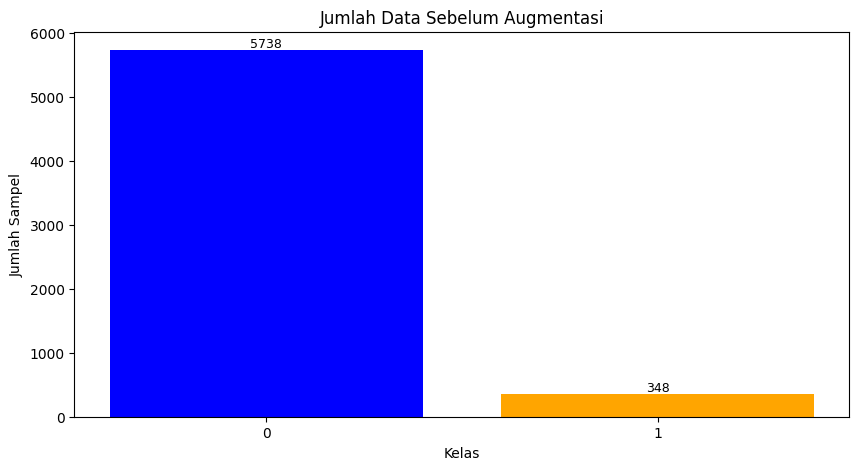

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'entries' and 'entriess' are lists of filenames from the respective directories
num_class_1_original = len(entries)  # Number of original samples for class 1
num_class_0_original = len(entriess)  # Number of original samples for class 0

# Assuming 'augmented_data' contains the augmented images for class 1
num_class_1_augmented = len(augmented_data)

# Total number of samples for each class after augmentation
total_class_1 = num_class_1_original + num_class_1_augmented
total_class_0 = num_class_0_original

# Create a bar chart
plt.figure(figsize=(10, 5))
bars = plt.bar(['0', '1'], [num_class_0_original, num_class_1_original], color=['blue', 'orange'])
plt.xlabel('Kelas')
plt.ylabel('Jumlah Sampel')
plt.title('Jumlah Data Sebelum Augmentasi')

# Add value labels on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=9)

plt.show()


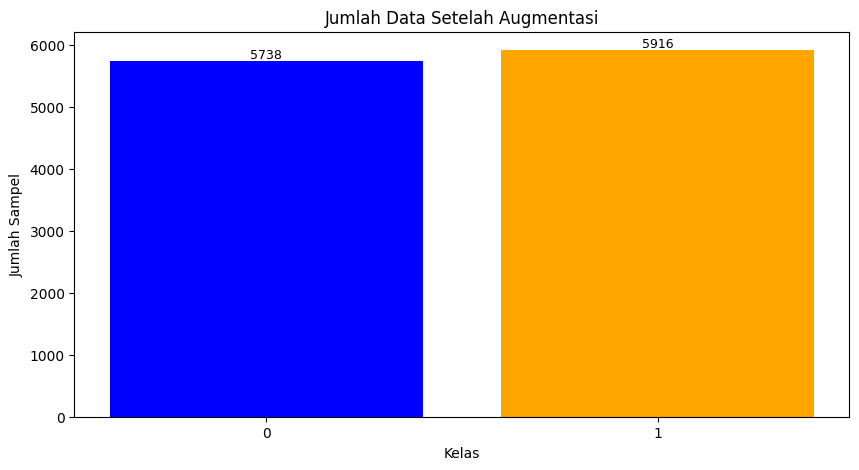

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'entries' and 'entriess' are lists of filenames from the respective directories
num_class_1_original = len(entries)  # Number of original samples for class 1
num_class_0_original = len(entriess)  # Number of original samples for class 0

# Assuming 'augmented_data' contains the augmented images for class 1
num_class_1_augmented = len(augmented_data)

# Total number of samples for each class after augmentation
total_class_1 = num_class_1_original + num_class_1_augmented
total_class_0 = num_class_0_original

# Create a bar chart
plt.figure(figsize=(10, 5))
bars = plt.bar(['0', '1'], [total_class_0, total_class_1], color=['blue', 'orange'])
plt.xlabel('Kelas')
plt.ylabel('Jumlah Sampel')
plt.title('Jumlah Data Setelah Augmentasi')

# Add value labels on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=9)

plt.show()


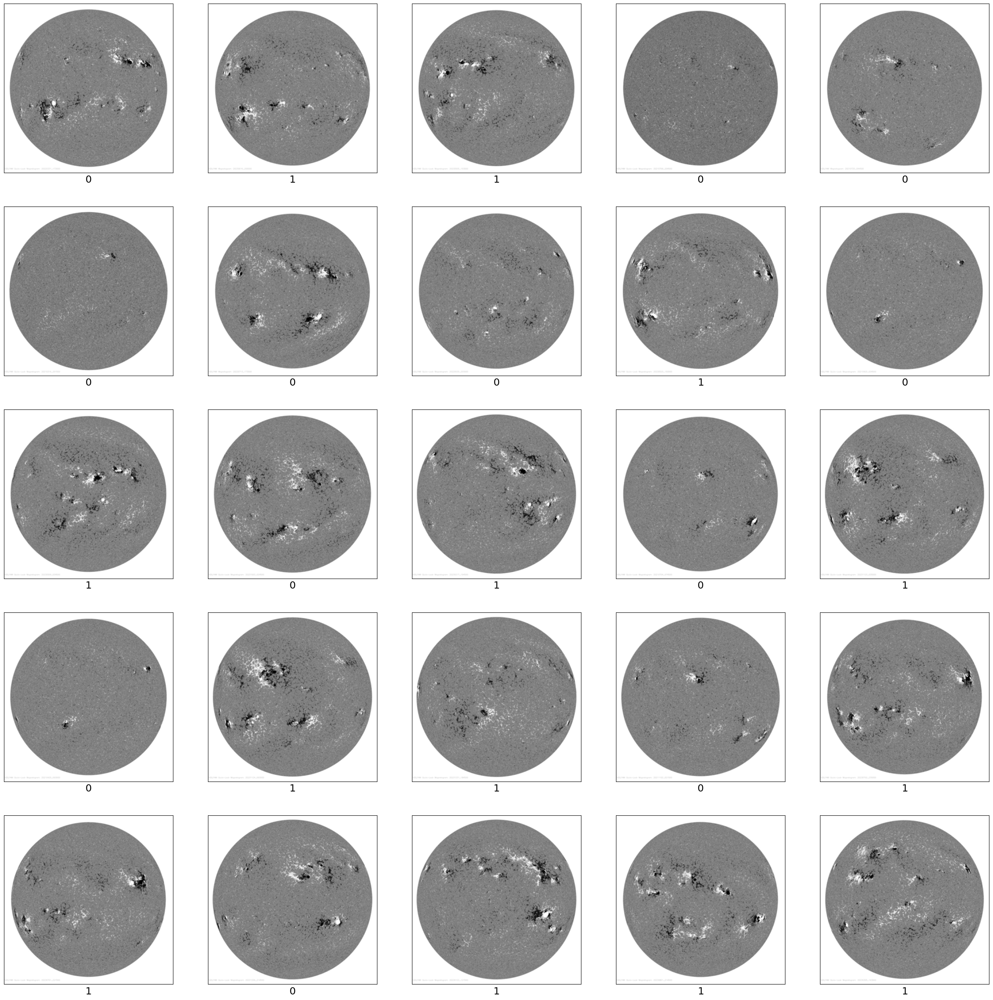

In [ ]:
plt.figure(figsize=(32,32))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([]) # Remove ticks on x-axis and y-axis
    plt.yticks([])
    plt.grid(False) # Turn off grid on the subplot
    x = np.random.randint(len(data_combined)) # Select a random index from the dataset
    plt.imshow(data_combined[x], cmap=plt.cm.binary) # Display the image
    plt.xlabel(labels_combined[x], fontsize=18) # Display the corresponding label
plt.show()

As we want to teach the computer how to classify images, we need to make sure that the dataset is good balanced. Fortunately, as we can see from the following plot, this is the case.

In [ ]:
# Split the data into training and testing sets
train_images, test_images, train_labels, test_labels = train_test_split(
    data_combined, labels_combined, test_size=0.15, random_state=42)

# Convert to numpy arrays if not already
train_images = np.array(train_images)
test_images = np.array(test_images)

# Training Dataset
print('Training Dataset:')
print(f'Jumlah seluruh gambar: {train_images.shape[0]}')
print(f'Jumlah gambar dengan label 1: {np.sum(train_labels == 1)}')
print(f'Jumlah gambar dengan label 0: {np.sum(train_labels == 0)}\n')

# Test Dataset
print('Test Dataset:')
print(f'Jumlah seluruh gambar: {test_images.shape[0]}')
print(f'Jumlah gambar dengan label 1: {np.sum(test_labels == 1)}')
print(f'Jumlah gambar dengan label 0: {np.sum(test_labels == 0)}\n')


Training Dataset:
Jumlah seluruh gambar: 9905
Jumlah gambar dengan label 1: 5026
Jumlah gambar dengan label 0: 4879

Test Dataset:
Jumlah seluruh gambar: 1749
Jumlah gambar dengan label 1: 890
Jumlah gambar dengan label 0: 859



###**3.1.3 Machine Learning Processing**

####**3.1.2.1. AlexNet**

In [ ]:
#Model Alexnet
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import class_weight
import gc
from keras import backend as K

# Function to create a CNN model
def create_cnn_model(size):
    model = Sequential()

    # Layer 1
    model.add(Conv2D(96, kernel_size=(11, 11), strides=(4, 4), padding='valid',activation='relu', input_shape=(size,size,1)))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2),padding='valid'))
    model.add(Conv2D(256, kernel_size=(5, 5), strides=(1,1),activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))


    # Layer 3-5
    model.add(Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))


    # Flattening
    model.add(Flatten())

    # Fully connected layers
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))

    # Output Layer for Binary Classification
    model.add(Dense(1, activation='sigmoid'))
# Compile the model
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalisasi data
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data untuk CNN
    train_images = train_images.reshape((-1, size, size, 1))
    test_images = test_images.reshape((-1, size, size, 1))

    classifier = create_cnn_model(size)
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=20,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()
    K.clear_session()

####**3.1.2.1. AlexNet 4ConvD**

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import class_weight
import gc
from keras import backend as K

# Function to create a CNN model
def create_cnn_model(size):
    model = Sequential()

    # Layer 1
    model.add(Conv2D(96, kernel_size=(11, 11), strides=(4, 4), padding='valid',activation='relu', input_shape=(size,size,1)))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2),padding='valid'))


    # Layer 2
    model.add(Conv2D(256, kernel_size=(5, 5), strides=(1,1),activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))


    # Layer 3-4
    model.add(Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))


    # Flattening
    model.add(Flatten())

    # Fully connected layers
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))

    # Output Layer for Binary Classification
    model.add(Dense(1, activation='sigmoid'))
    # Compile the model
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalisasi data
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data untuk CNN
    train_images = train_images.reshape((-1, size, size, 1))
    test_images = test_images.reshape((-1, size, size, 1))

    classifier = create_cnn_model(size)
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()
    K.clear_session()


####**3.1.2.1. AlexNet 6 ConvD**

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import class_weight
import gc
from keras import backend as K

# Function to create a CNN model
def create_cnn_model(size):
    model = Sequential()

    # Layer 1
    model.add(Conv2D(96, kernel_size=(11, 11), strides=(4, 4), padding='valid',activation='relu', input_shape=(size,size,1)))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2),padding='valid'))


    # Layer 2
    model.add(Conv2D(256, kernel_size=(5, 5), strides=(1,1),activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))


    # Layer 3-6
    model.add(Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))


    # Flattening
    model.add(Flatten())

    # Fully connected layers
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))

    # Output Layer for Binary Classification
    model.add(Dense(1, activation='sigmoid'))
    # Compile the model
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalisasi data
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data untuk CNN
    train_images = train_images.reshape((-1, size, size, 1))
    test_images = test_images.reshape((-1, size, size, 1))

    classifier = create_cnn_model(size)
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()
    K.clear_session()


####**3.1.2.2.LeNet-5**

In [ ]:
#model LeNet
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import class_weight
import gc

# Function to create a CNN model
def create_cnn_model(size):
    model = Sequential()

    #Layer 1
    model.add(Conv2D(6, kernel_size=(5, 5), activation='relu', input_shape=(size,size,1)))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Layer 2
    model.add(Conv2D(16, kernel_size=(5, 5), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Flatten
    model.add(Flatten())

    # Fully Connected Layer 1
    model.add(Dense(120, activation='relu'))

    # Fully Connected Layer 2
    model.add(Dense(84, activation='relu'))

    # Output Layer
    model.add(Dense(1, activation='sigmoid'))

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalisasi data
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data untuk CNN
    train_images = train_images.reshape((-1, size, size, 1))
    test_images = test_images.reshape((-1, size, size, 1))

    classifier = create_cnn_model(size)
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=2,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()

####**3.1.2.2.LeNet-4**

In [ ]:
#model LeNet
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import class_weight
import gc

# Function to create a CNN model (same as before)
def create_cnn_model(size):
    model = Sequential()

    # Convolutional Layer 1
    model.add(Conv2D(4, kernel_size=(5, 5), activation='relu', input_shape=(size,size,1)))
    # Max Pooling Layer 1
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Convolutional Layer 2
    model.add(Conv2D(16, kernel_size=(5, 5), activation='relu'))
    # Max Pooling Layer 2
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Flatten the previous layer output
    model.add(Flatten())

    # Fully Connected Layer 1
    model.add(Dense(120, activation='relu'))

    # Output Layer
    model.add(Dense(1, activation='sigmoid'))  # Jumlah kelas pada output layer, misalnya untuk MNIST dataset

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalisasi data
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data untuk CNN
    train_images = train_images.reshape((-1, size, size, 1))
    test_images = test_images.reshape((-1, size, size, 1))

    classifier = create_cnn_model(size)
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()

####**3.1.2.2.LeNet-1**

In [ ]:
#model LeNet
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import class_weight
import gc

# Function to create a CNN model (same as before)
def create_cnn_model(size):
    model = Sequential()

    # Convolutional Layer 1
    model.add(Conv2D(4, kernel_size=(5, 5), activation='relu', input_shape=(size,size,1)))
    # Max Pooling Layer 1
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Convolutional Layer 2
    model.add(Conv2D(8, kernel_size=(5, 5), activation='relu'))
    # Max Pooling Layer 2
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Flatten the previous layer output
    model.add(Flatten())

    # Output Layer
    model.add(Dense(1, activation='sigmoid'))  # Jumlah kelas pada output layer, misalnya untuk MNIST dataset

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalisasi data
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data untuk CNN
    train_images = train_images.reshape((-1, size, size, 1))
    test_images = test_images.reshape((-1, size, size, 1))

    classifier = create_cnn_model(size)
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()

####**3.1.2.3. ResNet50**



In [ ]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, GlobalAveragePooling2D, BatchNormalization, Activation, Add
from tensorflow.keras.applications import ResNet50
from sklearn.model_selection import StratifiedKFold
import numpy as np
from keras import backend as K
import gc

# Function to create a CNN model
def create_resnet_model(size):
    base_model = ResNet50(weights=None, include_top=False, input_shape=(size, size, 1))

    for layer in base_model.layers:
        layer.trainable = False  # Freeze the layers of the pre-trained ResNet50

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(120, activation='relu')(x)
    x = Dense(84, activation='relu')(x)
    predictions = Dense(1, activation='sigmoid')(x)

    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model

# Assuming 'data_combined' and 'labels_combined' are defined earlier

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

for train_index, test_index in skf.split(data_combined, labels_combined):
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalization
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data for CNN
    train_images = train_images.reshape((-1, size, size, 1))  # Assuming RGB images
    test_images = test_images.reshape((-1, size, size, 1))

    classifier = create_resnet_model(size)

    # Compile model
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()
    K.clear_session()

73/73 [==============================] - 10s 144ms/step - loss: 0.1036 - accuracy: 0.9662 - val_loss: 0.0939 - val_accuracy: 0.9678
Epoch 41/90
73/73 [==============================] - 10s 143ms/step - loss: 0.1033 - accuracy: 0.9674 - val_loss: 0.1132 - val_accuracy: 0.9670
Epoch 42/90
73/73 [==============================] - 10s 143ms/step - loss: 0.1247 - accuracy: 0.9615 - val_loss: 0.0950 - val_accuracy: 0.9678
Epoch 43/90
73/73 [==============================] - 10s 143ms/step - loss: 0.1020 - accuracy: 0.9681 - val_loss: 0.0978 - val_accuracy: 0.9674
Epoch 44/90
73/73 [==============================] - 10s 144ms/step - loss: 0.1037 - accuracy: 0.9689 - val_loss: 0.0933 - val_accuracy: 0.9682
Epoch 45/90
73/73 [==============================] - 10s 143ms/step - loss: 0.0994 - accuracy: 0.9690 - val_loss: 0.1135 - val_accuracy: 0.9665
Epoch 46/90
73/73 [==============================] - 10s 143ms/step - loss: 0.0962 - accuracy: 0.9691 - val_loss: 0.1085 - val_accuracy: 0.9674
Epoc

In [ ]:
#ResNet50
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, GlobalAveragePooling2D
from keras.applications import ResNet50
from sklearn.model_selection import StratifiedKFold
import numpy as np
from keras import backend as K
import gc


# Function to create a CNN model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense, BatchNormalization, Activation, Add
from tensorflow.keras.models import Model

def identity_block(input_tensor, filters, kernel_size):
    filters1, filters2, filters3 = filters

    x = Conv2D(filters1, (1, 1))(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters2, kernel_size, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters3, (1, 1))(x)
    x = BatchNormalization()(x)

    x = Add()([x, input_tensor])
    x = Activation('relu')(x)
    return x

def convolutional_block(input_tensor, filters, kernel_size, strides=(2, 2)):
    filters1, filters2, filters3 = filters

    x = Conv2D(filters1, (1, 1), strides=strides)(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters2, kernel_size, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters3, (1, 1))(x)
    x = BatchNormalization()(x)

    shortcut = Conv2D(filters3, (1, 1), strides=strides)(input_tensor)
    shortcut = BatchNormalization()(shortcut)

    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    return x

def ResNet50_model(input_shape=(300, 300, 1), classes=1):
    input_tensor = Input(shape=input_shape)

    x = Conv2D(64, (7, 7), strides=(2, 2), padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

    x = convolutional_block(x, filters=[64, 64, 256], kernel_size=(3, 3), strides=(1, 1))
    x = identity_block(x, filters=[64, 64, 256], kernel_size=(3, 3))
    x = identity_block(x, filters=[64, 64, 256], kernel_size=(3, 3))

    x = convolutional_block(x, filters=[128, 128, 512], kernel_size=(3, 3))
    x = identity_block(x, filters=[128, 128, 512], kernel_size=(3, 3))
    x = identity_block(x, filters=[128, 128, 512], kernel_size=(3, 3))
    x = identity_block(x, filters=[128, 128, 512], kernel_size=(3, 3))

    x = convolutional_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))
    x = identity_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))
    x = identity_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))
    x = identity_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))
    x = identity_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))
    x = identity_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))

    x = convolutional_block(x, filters=[512, 512, 2048], kernel_size=(3, 3))
    x = identity_block(x, filters=[512, 512, 2048], kernel_size=(3, 3))
    x = identity_block(x, filters=[512, 512, 2048], kernel_size=(3, 3))

    x = GlobalAveragePooling2D()(x)
    x = Dense(classes, activation='sigmoid')(x)

    model = Model(inputs=input_tensor, outputs=x)
    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Assuming 'data_combined' and 'labels_combined' are defined earlier

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalization
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data for CNN
    train_images = train_images.reshape((-1, size, size, 1))
    test_images = test_images.reshape((-1, size, size, 1))

    classifier = ResNet50_model(input_shape=(size, size, 1))

    # Compile model
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()
    K.clear_session()



####**3.1.2.4. MobileNet**



In [ ]:
from keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, GlobalAveragePooling2D, BatchNormalization, DepthwiseConv2D
from keras.models import Model
from sklearn.model_selection import StratifiedKFold
import numpy as np
from keras import backend as K
import gc

def depthwise_separable_conv_block(input_tensor, filters, kernel_size, strides):
    x = DepthwiseConv2D(kernel_size, strides=strides, padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters, (1, 1), strides=(1, 1), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    return x

def create_mobilenet_model(input_shape=(300, 300, 1), classes=1):
    input_tensor = Input(shape=input_shape)

    # Initial Convolution
    x = Conv2D(32, (3, 3), strides=(2, 2), padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # Depthwise Separable Convolution Blocks
    x = depthwise_separable_conv_block(x, 64, (3, 3), strides=(1, 1))
    x = depthwise_separable_conv_block(x, 128, (3, 3), strides=(2, 2))
    x = depthwise_separable_conv_block(x, 128, (3, 3), strides=(1, 1))
    x = depthwise_separable_conv_block(x, 256, (3, 3), strides=(2, 2))
    x = depthwise_separable_conv_block(x, 256, (3, 3), strides=(1, 1))
    x = depthwise_separable_conv_block(x, 512, (3, 3), strides=(2, 2))

    # 5 Depthwise Separable Convolution Blocks
    for _ in range(5):
        x = depthwise_separable_conv_block(x, 512, (3, 3), strides=(1, 1))

    x = depthwise_separable_conv_block(x, 1024, (3, 3), strides=(2, 2))
    x = depthwise_separable_conv_block(x, 1024, (3, 3), strides=(1, 1))

    # Global Average Pooling and Classification
    x = GlobalAveragePooling2D()(x)
    output_tensor = Dense(classes, activation='sigmoid')(x)

    model = Model(inputs=input_tensor, outputs=output_tensor)
    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalization
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data for CNN
    train_images = train_images.reshape((-1, size, size, 1))
    test_images = test_images.reshape((-1, size, size, 1))

    classifier = create_mobilenet_model((size, size, 1))

    # Compile model
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()
    K.clear_session()


73/73 [==============================] - 13s 174ms/step - loss: 5.3026e-07 - accuracy: 1.0000 - val_loss: 0.0257 - val_accuracy: 0.9953
Epoch 85/90
73/73 [==============================] - 13s 174ms/step - loss: 4.4331e-07 - accuracy: 1.0000 - val_loss: 0.0258 - val_accuracy: 0.9953
Epoch 86/90
73/73 [==============================] - 13s 174ms/step - loss: 2.6293e-07 - accuracy: 1.0000 - val_loss: 0.0261 - val_accuracy: 0.9953
Epoch 87/90
73/73 [==============================] - 13s 174ms/step - loss: 5.1222e-07 - accuracy: 1.0000 - val_loss: 0.0259 - val_accuracy: 0.9953
Epoch 88/90
73/73 [==============================] - 13s 174ms/step - loss: 3.7763e-07 - accuracy: 1.0000 - val_loss: 0.0260 - val_accuracy: 0.9953
Epoch 89/90
73/73 [==============================] - 13s 175ms/step - loss: 4.1836e-07 - accuracy: 1.0000 - val_loss: 0.0262 - val_accuracy: 0.9953
Epoch 90/90
73/73 [==============================] - 13s 174ms/step - loss: 3.2062e-07 - accuracy: 1.0000 - val_loss: 0.0265

In [ ]:
from keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, GlobalAveragePooling2D, BatchNormalization, DepthwiseConv2D
from keras.models import Model
from sklearn.model_selection import StratifiedKFold
import numpy as np
from keras import backend as K
import gc

def depthwise_separable_conv_block(input_tensor, filters, kernel_size, strides):
    x = DepthwiseConv2D(kernel_size, strides=strides, padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters, (1, 1), strides=(1, 1), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    return x

def create_mobilenet_model(input_shape=(300, 300, 1), classes=1):
    input_tensor = Input(shape=input_shape)

    # Initial Convolution
    x = Conv2D(32, (3, 3), strides=(2, 2), padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # Depthwise Separable Convolution Blocks
    x = depthwise_separable_conv_block(x, 64, (3, 3), strides=(1, 1))
    x = depthwise_separable_conv_block(x, 128, (3, 3), strides=(2, 2))
    x = depthwise_separable_conv_block(x, 128, (3, 3), strides=(1, 1))
    x = depthwise_separable_conv_block(x, 256, (3, 3), strides=(2, 2))
    x = depthwise_separable_conv_block(x, 256, (3, 3), strides=(1, 1))
    x = depthwise_separable_conv_block(x, 512, (3, 3), strides=(2, 2))

    # 5 Depthwise Separable Convolution Blocks
    for _ in range(5):
        x = depthwise_separable_conv_block(x, 512, (3, 3), strides=(1, 1))

    x = depthwise_separable_conv_block(x, 1024, (3, 3), strides=(2, 2))
    x = depthwise_separable_conv_block(x, 1024, (3, 3), strides=(1, 1))

    # Global Average Pooling and Classification
    x = GlobalAveragePooling2D()(x)
    output_tensor = Dense(classes, activation='sigmoid')(x)

    model = Model(inputs=input_tensor, outputs=output_tensor)
    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalization
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data for CNN
    train_images = train_images.reshape((-1, size, size, 1))
    test_images = test_images.reshape((-1, size, size, 1))

    classifier = create_mobilenet_model((size, size, 1))

    # Compile model
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()
    K.clear_session()


####**3.1.2.5. ShuffleNet2**



In [ ]:
from keras.models import Model
from keras.layers import GlobalAveragePooling2D, Dense
from keras.applications import ShuffleNetV2

# Function to create a CNN model with ShuffleNetV2
def create_cnn_model_shufflenet(size):
    base_model = ShuffleNetV2(input_shape=(size, size, 1), weights=None, include_top=False)
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(120, activation='relu')(x)
    x = Dense(84, activation='relu')(x)
    predictions = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Accuracy has been computed using cross-validation
size = 300
verbosity = 1
ACC = []
training_histories = []  # To store training history for each iteration

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Load your data and labels here (replace 'data' and 'labels' with your actual data)

for train_index, test_index in skf.split(data, labels):
    train_images, test_images = np.array(data)[train_index], np.array(data)[test_index]
    train_labels, test_labels = np.array(labels)[train_index], np.array(labels)[test_index]

    train_images = train_images / 255.0
    test_images = test_images / 255.0

    Train_images = []
    Test_images = []
    for i in range(len(train_images)):
        a = train_images[i].reshape(size, size, 1)
        Train_images.append(a)
    Train_images = np.array(Train_images)
    for j in range(len(test_images)):
        b = test_images[j].reshape(size, size, 1)
        Test_images.append(b)
    Test_images = np.array(Test_images)
    train_images, test_images = Train_images, Test_images

    classifier = create_cnn_model_shufflenet(size)  # Using ShuffleNetV2 architecture

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)

    # Append the accuracy of the last epoch for this iteration to ACC
    ACC.append(history.history['val_accuracy'][-1])


####**3.1.2.6. EfficientNet**


In [ ]:
#EfficientNet

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout
from sklearn.model_selection import StratifiedKFold
import numpy as np
from tensorflow.keras.applications import EfficientNetB0
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D


# Function to create a CNN model
def create_cnn_model(size):
    base_model = EfficientNetB0(weights=None, include_top=False, input_shape=(size,size,1))  # Ubah input_shape menjadi (size,size,3) karena gambar RGB
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Accuracy has been computed using cross-validation
size = 300
verbosity = 1
ACC = []
training_histories = []  # To store training history for each iteration

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Load your data and labels here (replace 'data' and 'labels' with your actual data)

for train_index, test_index in skf.split(data, labels):
    train_images, test_images = np.array(data)[train_index], np.array(data)[test_index]
    train_labels, test_labels = np.array(labels)[train_index], np.array(labels)[test_index]

    train_images = train_images / 255.0
    test_images = test_images / 255.0

    Train_images = []
    Test_images = []
    for i in range(len(train_images)):
        a = train_images[i].reshape(size, size, 1)
        Train_images.append(a)
    Train_images = np.array(Train_images)
    for j in range(len(test_images)):
        b = test_images[j].reshape(size, size, 1)
        Test_images.append(b)
    Test_images = np.array(Test_images)
    train_images, test_images = Train_images, Test_images

    classifier = create_cnn_model(size)

    # Compile the CNN
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])  #loss_function = sparse_categorical_crossentropy

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)

    # Append the accuracy of the last epoch for this iteration to ACC
    ACC.append(history.history['val_accuracy'][-1])

Epoch 1/90
39/39 [==============================] - 58s 519ms/step - loss: 0.2553 - accuracy: 0.9244 - val_loss: 0.3067 - val_accuracy: 0.9425
Epoch 2/90
39/39 [==============================] - 17s 445ms/step - loss: 0.1749 - accuracy: 0.9390 - val_loss: 0.4763 - val_accuracy: 0.9425
Epoch 3/90
39/39 [==============================] - 17s 446ms/step - loss: 0.1349 - accuracy: 0.9419 - val_loss: 0.5718 - val_accuracy: 0.9425
Epoch 4/90
39/39 [==============================] - 17s 446ms/step - loss: 0.1073 - accuracy: 0.9546 - val_loss: 0.7325 - val_accuracy: 0.9425
Epoch 5/90
39/39 [==============================] - 17s 447ms/step - loss: 0.1304 - accuracy: 0.9482 - val_loss: 0.6251 - val_accuracy: 0.9425
Epoch 6/90
39/39 [==============================] - 17s 446ms/step - loss: 0.0995 - accuracy: 0.9544 - val_loss: 0.6086 - val_accuracy: 0.9425
Epoch 7/90
39/39 [==============================] - 17s 448ms/step - loss: 0.0718 - accuracy: 0.9714 - val_loss: 0.6699 - val_accuracy: 0.9425

KeyboardInterrupt: 

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

# Function to create a VGG-16 model
def create_vgg16_model(size):
    model = Sequential()

    # Block 1
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(size, size, 1)))
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    # Block 2
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    # Block 3
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    # Flatten
    model.add(Flatten())

    # Fully Connected Layer 1
    model.add(Dense(4096, activation='relu'))

    # Fully Connected Layer 2
    model.add(Dense(4096, activation='relu'))

    # Output Layer
    model.add(Dense(1, activation='sigmoid'))  # Change 'num_classes' to the number of classes in your dataset

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Assuming num_classes is the number of classes in your dataset
num_classes = 1  # Change this according to your dataset

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalization of data
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data for VGG-16
    train_images = train_images.reshape((-1, size, size, 1))
    test_images = test_images.reshape((-1, size, size, 1))

    classifier = create_vgg16_model(size)

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()


In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import class_weight
import gc

# Function to create a VGG-19 model for binary classification
def create_vgg19_binary_model(size):
    model = Sequential()

    # Block 1
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(size, size, 1)))
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    # Block 2
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    # Block 3
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    # Block 4
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    # Block 5
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    # Flatten
    model.add(Flatten())

    # Fully Connected Layer 1
    model.add(Dense(4096, activation='relu'))

    # Fully Connected Layer 2
    model.add(Dense(4096, activation='relu'))

    # Output Layer
    model.add(Dense(1, activation='sigmoid'))  # Binary classification, so use 'sigmoid'

    # Compile the model
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model

# Assuming binary classification
num_classes = 1  # Change this according to your dataset

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalization of data
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data for VGG-19
    train_images = train_images.reshape((-1, size, size, 1))
    test_images = test_images.reshape((-1, size, size, 1))

    classifier = create_vgg19_binary_model(size)

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()


###**3.1.4. Solar Active Region Detection**

In [ ]:
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model

size = 300  # Size of the input images
model_path = '/content/AR_Detection.h5'  # Replace with the path to your trained model

# Load the trained model
classifier = load_model(model_path)

def preprocess_image(image_path):
    # Read and preprocess a single image
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (size, size))
    img = img.reshape(1, size, size, 1)
    img = img / 255.0  # Normalize pixel values
    return img

def predict_image(image_path):
    # Preprocess the image
    img = preprocess_image(image_path)

    # Make predictions
    prediction = classifier.predict(img)

    # Interpret the prediction
    if prediction[0][0] > 0.5:
        result = 'Flare'
    else:
        result = 'Non-Flare'

    return result

def predict_images_in_folder(folder_path):
    # Predict on all images in the given folder
    predictions = []

    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            image_path = os.path.join(folder_path, filename)
            result = predict_image(image_path)
            predictions.append((filename, result))

    return predictions


In [ ]:
#khusus file

from PIL import Image
import matplotlib.pyplot as plt
abu=[]
# Ganti dengan path ke gambar Anda
image_path = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION/Clean_images_MergedAvailable/gong_magxx_fd_20180204_192103.jpg'
result_single = predict_image(image_path)  # Menambahkan .convert('L') untuk membuatnya skala abu-abu

# Memuat gambar
image = Image.open(image_path)
abu.append(np.array(new_image.convert('L')))
# Menampilkan gambar
plt.imshow(new_image, cmap='gray')
plt.axis('off')  # Menonaktifkan sumbu koordinat


    # Menampilkan hasilnya
plt.show()

print(f"Image Prediction: {result_single}")

In [ ]:
#khusus folder
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os  # Digunakan untuk iterasi file dalam folder

abu = []

# Lokasi folder yang berisi gambar-gambar
folder_path = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION/Clean_images_MergedAvailable'

# Mendapatkan daftar semua file dalam folder
file_list = os.listdir(folder_path)

for file_name in file_list:
    try:
        # Membangun path lengkap ke gambar
        image_path = os.path.join(folder_path, file_name)

        # Prediksi gambar
        result_single = predict_image(image_path)

        # Memuat gambar
        image = Image.open(image_path)

        # Mengonversi gambar ke skala abu-abu
        gray_image = image.convert('L')
        abu.append(np.array(gray_image))  # Menambahkan gambar ke dalam daftar abu

        # Menampilkan gambar skala abu-abu
        plt.imshow(gray_image, cmap='gray')
        plt.axis('off')  # Menonaktifkan sumbu koordinat
        plt.show()  # Menampilkan gambar

        # Mencetak prediksi gambar
        print(f"Image Prediction: {result_single}")
    except Exception as e:
        print(f"Error processing {file_name}: {e}")

##**3.2. Flare**

###**3.2.1. Data Preparation**

####**3.2.1.1 2020-2022**

In [ ]:
#3D input
from keras.preprocessing.image import ImageDataGenerator
from PIL import Image
import numpy as np
import os

size = 300

# Direktori file
dir_mx = '/content/drive/MyDrive/Colab Notebook TA/FLARE/images_FlareMX_131'
#dir_abc = '/content/drive/MyDrive/Colab Notebook TA/FLARE/C_images_Flare_131'
dir_abc = '/content/drive/MyDrive/Colab Notebook TA/FLARE/C_images_Flare_131'

entries = os.listdir(dir_mx)
entriess = os.listdir(dir_abc)

data = []
labels = []

# Membaca data
for i in entries:
    try:
        image = Image.open(os.path.join(dir_mx, i))
        new_image = image.resize((size, size))
        # Convert grayscale image to RGB by duplicating the channel
        rgb_image = np.array(new_image.convert('RGB'))
        data.append(rgb_image)
        labels.append(1)
    except Exception as e:
        print('Cannot process file:', i, '| Error:', e)

for j in entriess:
    try:
        images = Image.open(os.path.join(dir_abc, j))
        new_images = images.resize((size, size))
        # Convert grayscale image to RGB by duplicating the channel
        rgb_images = np.array(new_images.convert('RGB'))
        data.append(rgb_images)
        labels.append(0)
    except Exception as e:
        print('Cannot process file:', j, '| Error:', e)

data = np.array(data)
labels = np.array(labels)

# Mengidentifikasi data kelas minoritas (kelas 1)
data_minoritas = data[labels == 1]
labels_minoritas = labels[labels == 1]

# Konfigurasi Data Augmentation
data_gen_args = {
    'rotation_range': 0,
    'width_shift_range': 0,
    'height_shift_range': 0,
    'shear_range': 0,
    'zoom_range': 0,
    'horizontal_flip': False,
     'rescale':None,
    'fill_mode': 'nearest'
}

image_datagen = ImageDataGenerator(**data_gen_args)

# Augmentasi data kelas minoritas
augmented_data = []
augmented_labels = []

for img in data_minoritas:
    i = 0
    for batch in image_datagen.flow(np.expand_dims(img, axis=0), batch_size=1):
        augmented_data.append(batch[0].astype('uint8'))
        augmented_labels.append(1)  # Label kelas minoritas
        i += 1
        if i >= 23:  # Misalnya, membuat 23 augmentasi per gambar
            break

augmented_data = np.array(augmented_data)
augmented_labels = np.array(augmented_labels)

# Menggabungkan data augmentasi dengan data asli
data_combined = np.concatenate((data, augmented_data), axis=0)
labels_combined = np.concatenate((labels, augmented_labels), axis=0)


In [ ]:
#3D input
from keras.preprocessing.image import ImageDataGenerator
from PIL import Image
import numpy as np
import os

size = 300

# Direktori file
dir_mx = '/content/drive/MyDrive/Colab Notebook TA/FLARE/images_FlareMX_131'
dir_abc = '/content/drive/MyDrive/Colab Notebook TA/FLARE/C_images_Flare_131'

entries = os.listdir(dir_mx)
entriess = os.listdir(dir_abc)

data = []
labels = []

# Membaca data
for i in entries:
    try:
        image = Image.open(os.path.join(dir_mx, i))
        new_image = image.resize((size, size))
        # Convert grayscale image to RGB by duplicating the channel
        rgb_image = np.array(new_image.convert('RGB'))
        data.append(rgb_image)
        labels.append(1)
    except Exception as e:
        print('Cannot process file:', i, '| Error:', e)

for j in entriess:
    try:
        images = Image.open(os.path.join(dir_abc, j))
        new_images = images.resize((size, size))
        # Convert grayscale image to RGB by duplicating the channel
        rgb_images = np.array(new_images.convert('RGB'))
        data.append(rgb_images)
        labels.append(0)
    except Exception as e:
        print('Cannot process file:', j, '| Error:', e)

data = np.array(data)
labels = np.array(labels)

# Mengidentifikasi data kelas minoritas (kelas 1)
data_minoritas = data[labels == 1]
labels_minoritas = labels[labels == 1]

# Konfigurasi Data Augmentation
data_gen_args = {
    'rotation_range': 20,
    'width_shift_range': 0.2,
    'height_shift_range': 0.2,
    'shear_range': 0.2,
    'zoom_range': 0.2,
    'horizontal_flip': True,
    'fill_mode': 'nearest'
}
image_datagen = ImageDataGenerator(**data_gen_args)

# Augmentasi data kelas minoritas
augmented_data = []
augmented_labels = []

for img in data_minoritas:
    i = 0
    for batch in image_datagen.flow(np.expand_dims(img, axis=0), batch_size=1):
        augmented_data.append(batch[0].astype('uint8'))
        augmented_labels.append(1)  # Label kelas minoritas
        i += 1
        if i >= 23:  # Misalnya, membuat 23 augmentasi per gambar
            break

augmented_data = np.array(augmented_data)
augmented_labels = np.array(augmented_labels)

# Menggabungkan data augmentasi dengan data asli
data_combined = np.concatenate((data, augmented_data), axis=0)
labels_combined = np.concatenate((labels, augmented_labels), axis=0)


In [ ]:
#Greyscale
from keras.preprocessing.image import ImageDataGenerator
from PIL import Image
import numpy as np
import os

size = 300

# Direktori file
dir_mx = '/content/drive/MyDrive/Colab Notebook TA/FLARE/images_FlareMX_131'
dir_abc = '/content/drive/MyDrive/Colab Notebook TA/FLARE/C_images_Flare_131'

entries = os.listdir(dir_mx)
entriess = os.listdir(dir_abc)

data = []
labels = []

# Membaca data
for i in entries:
    try:
        image = Image.open(os.path.join(dir_mx, i)).convert('L')  # Convert to greyscale
        new_image = image.resize((size, size))
        data.append(np.array(new_image))
        labels.append(1)
    except Exception as e:
        print('Cannot process file:', i, '| Error:', e)

for j in entriess:
    try:
        images = Image.open(os.path.join(dir_abc, j)).convert('L')  # Convert to greyscale
        new_images = images.resize((size, size))
        data.append(np.array(new_images))
        labels.append(0)
    except Exception as e:
        print('Cannot process file:', j, '| Error:', e)

data = np.array(data)
labels = np.array(labels)

# Mengidentifikasi data kelas minoritas (kelas 1)
data_minoritas = data[labels == 1]
labels_minoritas = labels[labels == 1]

# Konfigurasi Data Augmentation
data_gen_args = {
    'rotation_range': 20,
    'width_shift_range': 0.2,
    'height_shift_range': 0.2,
    'shear_range': 0.2,
    'zoom_range': 0.2,
    'horizontal_flip': True,
    'fill_mode': 'nearest'
}

image_datagen = ImageDataGenerator(**data_gen_args)

# Augmentasi data kelas minoritas
augmented_data = []
augmented_labels = []

for img in data_minoritas:
    i = 0
    img_expanded = np.expand_dims(img, axis=-1)  # Add channel dimension for grayscale image
    for batch in image_datagen.flow(np.expand_dims(img_expanded, axis=0), batch_size=1):
        augmented_data.append(batch[0].astype('uint8'))
        augmented_labels.append(1)  # Label kelas minoritas
        i += 1
        if i >= 23:  # Misalnya, membuat 23 augmentasi per gambar
            break

augmented_data = np.array(augmented_data)
augmented_labels = np.array(augmented_labels)

# Menggabungkan data augmentasi dengan data asli
data_combined = np.concatenate((data, augmented_data), axis=0)
labels_combined = np.concatenate((labels, augmented_labels), axis=0)


####**3.2.1.2 2020-2023**

In [ ]:
#3D input
from keras.preprocessing.image import ImageDataGenerator
from PIL import Image
import numpy as np
import os

size = 300

# Direktori file
dir_mx = '/content/drive/MyDrive/Colab Notebook TA/FLARE 2/images_FlareMX_131'
#dir_abc = '/content/drive/MyDrive/Colab Notebook TA/FLARE/C_images_Flare_131'
dir_abc = '/content/drive/MyDrive/Colab Notebook TA/FLARE 2/C_images_Flare_131'

entries = os.listdir(dir_mx)
entriess = os.listdir(dir_abc)

data = []
labels = []

# Membaca data
for i in entries:
    try:
        image = Image.open(os.path.join(dir_mx, i))
        new_image = image.resize((size, size))
        # Convert grayscale image to RGB by duplicating the channel
        rgb_image = np.array(new_image.convert('RGB'))
        data.append(rgb_image)
        labels.append(1)
    except Exception as e:
        print('Cannot process file:', i, '| Error:', e)

for j in entriess:
    try:
        images = Image.open(os.path.join(dir_abc, j))
        new_images = images.resize((size, size))
        # Convert grayscale image to RGB by duplicating the channel
        rgb_images = np.array(new_images.convert('RGB'))
        data.append(rgb_images)
        labels.append(0)
    except Exception as e:
        print('Cannot process file:', j, '| Error:', e)

data = np.array(data)
labels = np.array(labels)

# Mengidentifikasi data kelas minoritas (kelas 1)
data_minoritas = data[labels == 1]
labels_minoritas = labels[labels == 1]

# Konfigurasi Data Augmentation
data_gen_args = {
    'rotation_range': 0,
    'width_shift_range': 0,
    'height_shift_range': 0,
    'shear_range': 0,
    'zoom_range': 0,
    'horizontal_flip': False,
     'rescale':None,
    'fill_mode': 'nearest'
}

image_datagen = ImageDataGenerator(**data_gen_args)

# Augmentasi data kelas minoritas
augmented_data = []
augmented_labels = []

for img in data_minoritas:
    i = 0
    for batch in image_datagen.flow(np.expand_dims(img, axis=0), batch_size=1):
        augmented_data.append(batch[0].astype('uint8'))
        augmented_labels.append(1)  # Label kelas minoritas
        i += 1
        if i >= 17:  # Misalnya, membuat 23 augmentasi per gambar
            break

augmented_data = np.array(augmented_data)
augmented_labels = np.array(augmented_labels)

# Menggabungkan data augmentasi dengan data asli
data_combined = np.concatenate((data, augmented_data), axis=0)
labels_combined = np.concatenate((labels, augmented_labels), axis=0)


In [ ]:
#3D input
from keras.preprocessing.image import ImageDataGenerator
from PIL import Image
import numpy as np
import os

size = 300

# Direktori file
dir_mx = '/content/drive/MyDrive/Colab Notebook TA/FLARE 2/images_FlareMX_131'
dir_abc = '/content/drive/MyDrive/Colab Notebook TA/FLARE 2/C_images_Flare_131'

entries = os.listdir(dir_mx)
entriess = os.listdir(dir_abc)

data = []
labels = []

# Membaca data
for i in entries:
    try:
        image = Image.open(os.path.join(dir_mx, i))
        new_image = image.resize((size, size))
        # Convert grayscale image to RGB by duplicating the channel
        rgb_image = np.array(new_image.convert('RGB'))
        data.append(rgb_image)
        labels.append(1)
    except Exception as e:
        print('Cannot process file:', i, '| Error:', e)

for j in entriess:
    try:
        images = Image.open(os.path.join(dir_abc, j))
        new_images = images.resize((size, size))
        # Convert grayscale image to RGB by duplicating the channel
        rgb_images = np.array(new_images.convert('RGB'))
        data.append(rgb_images)
        labels.append(0)
    except Exception as e:
        print('Cannot process file:', j, '| Error:', e)

data = np.array(data)
labels = np.array(labels)

# Mengidentifikasi data kelas minoritas (kelas 1)
data_minoritas = data[labels == 1]
labels_minoritas = labels[labels == 1]

# Konfigurasi Data Augmentation
data_gen_args = {
    'rotation_range': 20,
    'width_shift_range': 0.2,
    'height_shift_range': 0.2,
    'shear_range': 0.2,
    'zoom_range': 0.2,
    'horizontal_flip': True,
    'fill_mode': 'nearest'
}
image_datagen = ImageDataGenerator(**data_gen_args)

# Augmentasi data kelas minoritas
augmented_data = []
augmented_labels = []

for img in data_minoritas:
    i = 0
    for batch in image_datagen.flow(np.expand_dims(img, axis=0), batch_size=1):
        augmented_data.append(batch[0].astype('uint8'))
        augmented_labels.append(1)  # Label kelas minoritas
        i += 1
        if i >= 17:  # Misalnya, membuat 23 augmentasi per gambar
            break

augmented_data = np.array(augmented_data)
augmented_labels = np.array(augmented_labels)

# Menggabungkan data augmentasi dengan data asli
data_combined = np.concatenate((data, augmented_data), axis=0)
labels_combined = np.concatenate((labels, augmented_labels), axis=0)


###**3.2.2. Data Visualization**


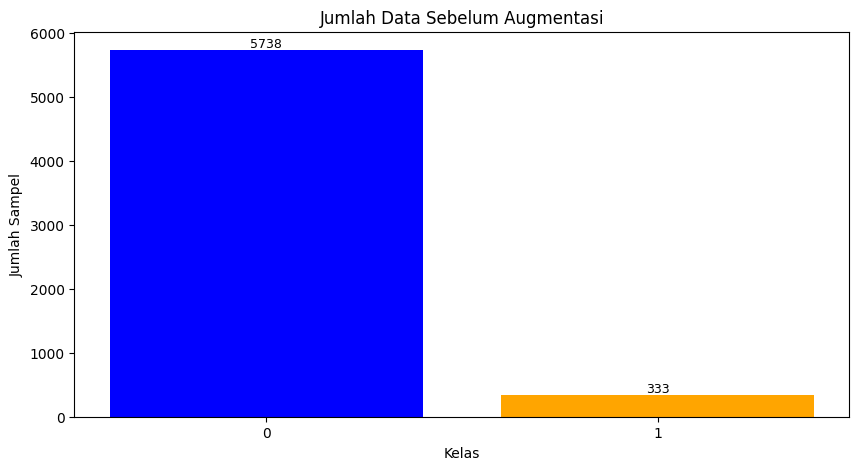

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'entries' and 'entriess' are lists of filenames from the respective directories
num_class_1_original = len(entries)  # Number of original samples for class 1
num_class_0_original = len(entriess)  # Number of original samples for class 0

# Assuming 'augmented_data' contains the augmented images for class 1
num_class_1_augmented = len(augmented_data)

# Total number of samples for each class after augmentation
total_class_1 = num_class_1_original + num_class_1_augmented
total_class_0 = num_class_0_original

# Create a bar chart
plt.figure(figsize=(10, 5))
bars = plt.bar(['0', '1'], [num_class_0_original, num_class_1_original], color=['blue', 'orange'])
plt.xlabel('Kelas')
plt.ylabel('Jumlah Sampel')
plt.title('Jumlah Data Sebelum Augmentasi')

# Add value labels on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=9)

plt.show()


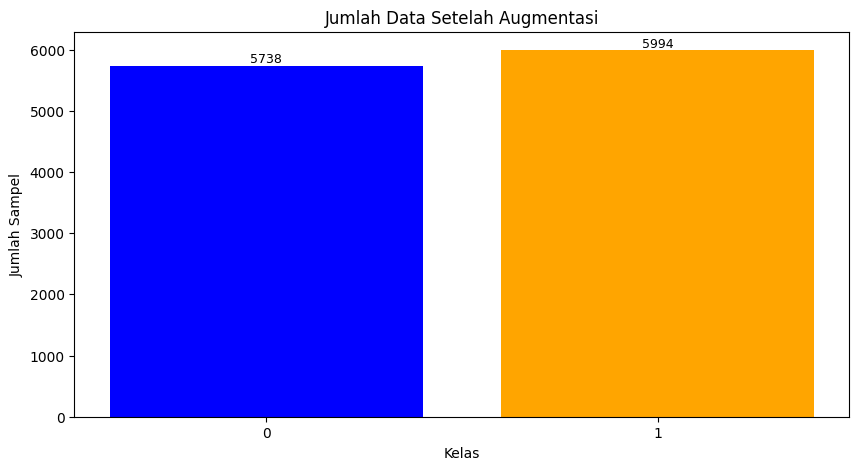

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'entries' and 'entriess' are lists of filenames from the respective directories
num_class_1_original = len(entries)  # Number of original samples for class 1
num_class_0_original = len(entriess)  # Number of original samples for class 0

# Assuming 'augmented_data' contains the augmented images for class 1
num_class_1_augmented = len(augmented_data)

# Total number of samples for each class after augmentation
total_class_1 = num_class_1_original + num_class_1_augmented
total_class_0 = num_class_0_original

# Create a bar chart
plt.figure(figsize=(10, 5))
bars = plt.bar(['0', '1'], [total_class_0, total_class_1], color=['blue', 'orange'])
plt.xlabel('Kelas')
plt.ylabel('Jumlah Sampel')
plt.title('Jumlah Data Setelah Augmentasi')

# Add value labels on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom', fontsize=9)

plt.show()


As we want to teach the computer how to classify images, we need to make sure that the dataset is good balanced. Fortunately, as we can see from the following plot, this is the case.

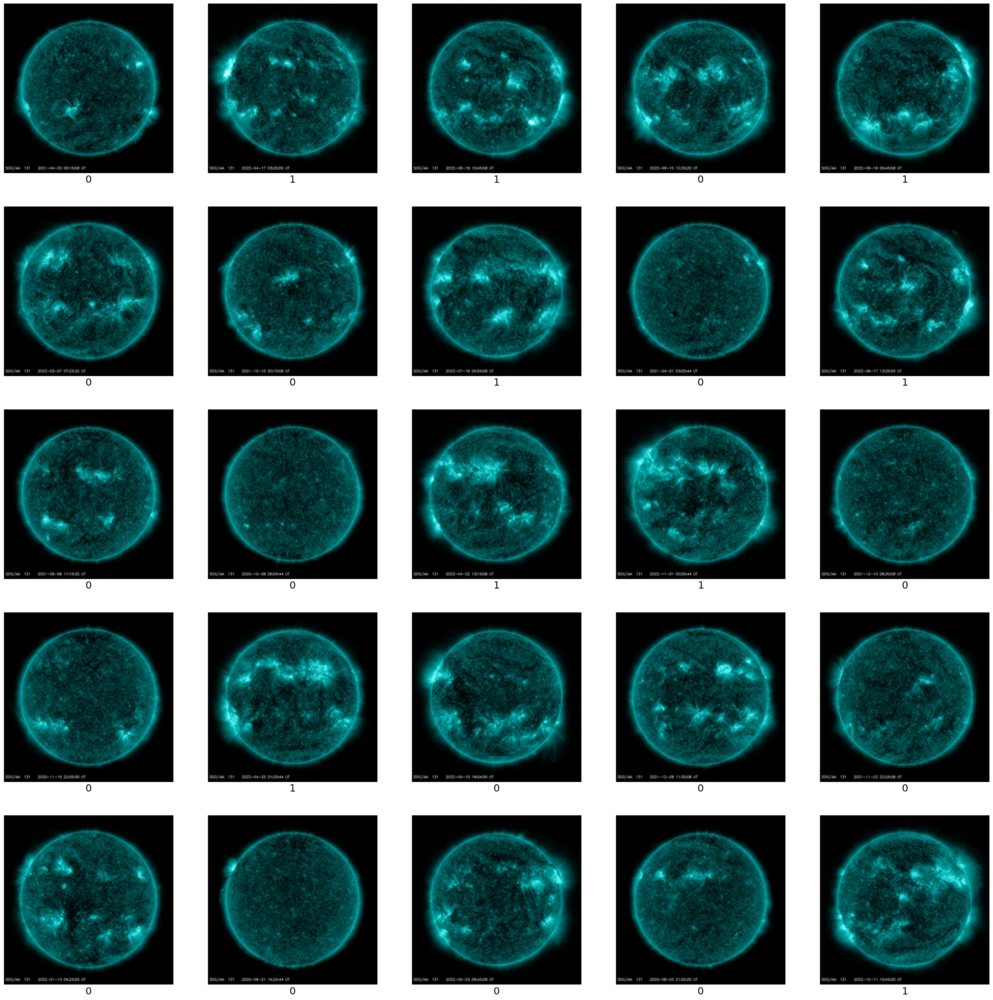

In [ ]:
plt.figure(figsize=(32,32))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([]) # Remove ticks on x-axis and y-axis
    plt.yticks([])
    plt.grid(False) # Turn off grid on the subplot
    x = np.random.randint(len(data_combined)) # Select a random index from the dataset
    plt.imshow(data_combined[x], cmap=plt.cm.binary) # Display the image
    plt.xlabel(labels_combined[x], fontsize=18) # Display the corresponding label
plt.show()

In [ ]:
# Split the data into training and testing sets
train_images, test_images, train_labels, test_labels = train_test_split(
    data_combined, labels_combined, test_size=0.15, random_state=42)

# Convert to numpy arrays if not already
train_images = np.array(train_images)
test_images = np.array(test_images)

# Training Dataset
print('Training Dataset:')
print(f'Jumlah seluruh gambar: {train_images.shape[0]}')
print(f'Jumlah gambar dengan label 1: {np.sum(train_labels == 1)}')
print(f'Jumlah gambar dengan label 0: {np.sum(train_labels == 0)}\n')

# Test Dataset
print('Test Dataset:')
print(f'Jumlah seluruh gambar: {test_images.shape[0]}')
print(f'Jumlah gambar dengan label 1: {np.sum(test_labels == 1)}')
print(f'Jumlah gambar dengan label 0: {np.sum(test_labels == 0)}\n')


Training Dataset:
Jumlah seluruh gambar: 9972
Jumlah gambar dengan label 1: 5102
Jumlah gambar dengan label 0: 4870

Test Dataset:
Jumlah seluruh gambar: 1760
Jumlah gambar dengan label 1: 892
Jumlah gambar dengan label 0: 868



###**3.2.3. Machine Learning Processing**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import os
import re
import io
from PIL import Image

import tensorflow as tf
from keras.datasets import mnist
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, Input, BatchNormalization, Activation, Add
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras.applications import ResNet50
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.utils.class_weight import compute_class_weight

# Clear garbage collector
import gc


####**3.2.2.1. AlexNet**

In [ ]:
#Model Alexnet
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import class_weight
import gc
from keras import backend as K

# Function to create a CNN model
def create_cnn_model(size):
    model = Sequential()

    # Layer 1
    model.add(Conv2D(96, kernel_size=(11, 11), strides=(4, 4), padding='valid',activation='relu', input_shape=(size,size,3)))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2),padding='valid'))

    # Layer 2
    model.add(Conv2D(256, kernel_size=(5, 5), strides=(1,1),activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))

    # Layer 3-5
    model.add(Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))

    # Flattening
    model.add(Flatten())

    # Fully connected layers
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))

    # Output Layer for Binary Classification
    model.add(Dense(1, activation='sigmoid'))
# Compile the model
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalisasi data
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data untuk CNN
    train_images = train_images.reshape((-1, size, size, 3))
    test_images = test_images.reshape((-1, size, size, 3))

    classifier = create_cnn_model(size)
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=20,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()
    K.clear_session()

Epoch 1/20
67/67 [==============================] - 13s 157ms/step - loss: 1.0568 - accuracy: 0.6617 - val_loss: 0.4275 - val_accuracy: 0.8121
Epoch 2/20
67/67 [==============================] - 5s 76ms/step - loss: 0.3960 - accuracy: 0.8243 - val_loss: 0.3500 - val_accuracy: 0.8461
Epoch 3/20
67/67 [==============================] - 5s 76ms/step - loss: 0.3423 - accuracy: 0.8433 - val_loss: 0.3270 - val_accuracy: 0.8560
Epoch 4/20
67/67 [==============================] - 5s 76ms/step - loss: 0.2766 - accuracy: 0.8803 - val_loss: 0.2318 - val_accuracy: 0.9164
Epoch 5/20
67/67 [==============================] - 5s 76ms/step - loss: 0.2428 - accuracy: 0.9048 - val_loss: 0.2032 - val_accuracy: 0.9297
Epoch 6/20
67/67 [==============================] - 5s 76ms/step - loss: 0.1965 - accuracy: 0.9288 - val_loss: 0.1962 - val_accuracy: 0.9263
Epoch 7/20
67/67 [==============================] - 5s 77ms/step - loss: 0.1837 - accuracy: 0.9373 - val_loss: 0.2171 - val_accuracy: 0.9212
Epoch 8/20


####**3.2.2.1. AlexNet 4ConvD**

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import class_weight
import gc
from keras import backend as K

# Function to create a CNN model
def create_cnn_model(size):
    model = Sequential()

    # Layer 1
    model.add(Conv2D(96, kernel_size=(11, 11), strides=(4, 4), padding='valid',activation='relu', input_shape=(size,size,3)))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2),padding='valid'))


    # Layer 2
    model.add(Conv2D(256, kernel_size=(5, 5), strides=(1,1),activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))


    # Layer 3-4
    model.add(Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))


    # Flattening
    model.add(Flatten())

    # Fully connected layers
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))

    # Output Layer for Binary Classification
    model.add(Dense(1, activation='sigmoid'))
    # Compile the model
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalisasi data
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data untuk CNN
    train_images = train_images.reshape((-1, size, size, 3))
    test_images = test_images.reshape((-1, size, size, 3))

    classifier = create_cnn_model(size)
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()
    K.clear_session()


####**3.2.2.1. AlexNet 6ConvD**

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import class_weight
import gc
from keras import backend as K

# Function to create a CNN model
def create_cnn_model(size):
    model = Sequential()

    # Layer 1
    model.add(Conv2D(96, kernel_size=(11, 11), strides=(4, 4), padding='valid',activation='relu', input_shape=(size,size,3)))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2),padding='valid'))


    # Layer 2
    model.add(Conv2D(256, kernel_size=(5, 5), strides=(1,1),activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))


    # Layer 3-6
    model.add(Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(Conv2D(384, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))


    # Flattening
    model.add(Flatten())

    # Fully connected layers
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))

    # Output Layer for Binary Classification
    model.add(Dense(1, activation='sigmoid'))
    # Compile the model
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalisasi data
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data untuk CNN
    train_images = train_images.reshape((-1, size, size, 3))
    test_images = test_images.reshape((-1, size, size, 3))

    classifier = create_cnn_model(size)
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=36,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()
    K.clear_session()


####**3.2.2.2. LeNet-5**

In [ ]:
#model LeNet
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import class_weight
import gc

# Function to create a CNN model (same as before)
def create_cnn_model(size):
    model = Sequential()

    # Convolutional Layer 1
    model.add(Conv2D(6, kernel_size=(5, 5), activation='relu', input_shape=(size,size,3)))
    # Max Pooling Layer 1
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Convolutional Layer 2
    model.add(Conv2D(16, kernel_size=(5, 5), activation='relu'))
    # Max Pooling Layer 2
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Flatten the previous layer output
    model.add(Flatten())

    # Fully Connected Layer 1
    model.add(Dense(120, activation='relu'))

    # Fully Connected Layer 2
    model.add(Dense(84, activation='relu'))

    # Output Layer
    model.add(Dense(1, activation='sigmoid'))  # Jumlah kelas pada output layer, misalnya untuk MNIST dataset

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalisasi data
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data untuk CNN
    train_images = train_images.reshape((-1, size, size, 3))
    test_images = test_images.reshape((-1, size, size, 3))

    classifier = create_cnn_model(size)
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=2,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()

Epoch 1/2
67/67 [==============================] - 10s 124ms/step - loss: 0.1290 - accuracy: 0.9609 - val_loss: 0.0843 - val_accuracy: 0.9759
Epoch 2/2
67/67 [==============================] - 4s 65ms/step - loss: 0.0708 - accuracy: 0.9803 - val_loss: 0.0809 - val_accuracy: 0.9754
Epoch 1/2
67/67 [==============================] - 10s 125ms/step - loss: 0.1018 - accuracy: 0.9632 - val_loss: 0.0956 - val_accuracy: 0.9750
Epoch 2/2
67/67 [==============================] - 4s 64ms/step - loss: 0.0640 - accuracy: 0.9799 - val_loss: 0.0917 - val_accuracy: 0.9754
Epoch 1/2
67/67 [==============================] - 10s 127ms/step - loss: 0.1422 - accuracy: 0.9551 - val_loss: 0.0689 - val_accuracy: 0.9802
Epoch 2/2
67/67 [==============================] - 4s 65ms/step - loss: 0.0779 - accuracy: 0.9787 - val_loss: 0.0605 - val_accuracy: 0.9806
Epoch 1/2
67/67 [==============================] - 10s 127ms/step - loss: 0.1351 - accuracy: 0.9560 - val_loss: 0.0731 - val_accuracy: 0.9821
Epoch 2/2
67

####**3.2.2.2. LeNet-4**

In [ ]:
#model LeNet
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import class_weight
import gc

# Function to create a CNN model (same as before)
def create_cnn_model(size):
    model = Sequential()

    # Convolutional Layer 1
    model.add(Conv2D(4, kernel_size=(5, 5), activation='relu', input_shape=(size,size,3)))
    # Max Pooling Layer 1
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Convolutional Layer 2
    model.add(Conv2D(16, kernel_size=(5, 5), activation='relu'))
    # Max Pooling Layer 2
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Flatten the previous layer output
    model.add(Flatten())

    # Fully Connected Layer 1
    model.add(Dense(120, activation='relu'))

    # Output Layer
    model.add(Dense(1, activation='sigmoid'))  # Jumlah kelas pada output layer, misalnya untuk MNIST dataset

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalisasi data
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data untuk CNN
    train_images = train_images.reshape((-1, size, size, 3))
    test_images = test_images.reshape((-1, size, size, 3))

    classifier = create_cnn_model(size)
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()

####**3.2.2.2. LeNet-1**

In [ ]:
#model LeNet
from sklearn.model_selection import StratifiedKFold
from sklearn.utils import class_weight
import gc

# Function to create a CNN model (same as before)
def create_cnn_model(size):
    model = Sequential()

    # Convolutional Layer 1
    model.add(Conv2D(4, kernel_size=(5, 5), activation='relu', input_shape=(size,size,3)))
    # Max Pooling Layer 1
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Convolutional Layer 2
    model.add(Conv2D(8, kernel_size=(5, 5), activation='relu'))
    # Max Pooling Layer 2
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Flatten the previous layer output
    model.add(Flatten())

    # Output Layer
    model.add(Dense(1, activation='sigmoid'))  # Jumlah kelas pada output layer, misalnya untuk MNIST dataset

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalisasi data
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data untuk CNN
    train_images = train_images.reshape((-1, size, size, 3))
    test_images = test_images.reshape((-1, size, size, 3))

    classifier = create_cnn_model(size)
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()

####**3.2.2.3. ResNet50**



In [ ]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, GlobalAveragePooling2D, BatchNormalization, Activation, Add
from tensorflow.keras.applications import ResNet50
from sklearn.model_selection import StratifiedKFold
import numpy as np
from keras import backend as K
import gc

# Function to create a CNN model
def create_resnet_model(size):
    base_model = ResNet50(weights=None, include_top=False, input_shape=(size, size, 3))

    for layer in base_model.layers:
        layer.trainable = False  # Freeze the layers of the pre-trained ResNet50

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(120, activation='relu')(x)
    x = Dense(84, activation='relu')(x)
    predictions = Dense(1, activation='sigmoid')(x)

    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model

# Assuming 'data_combined' and 'labels_combined' are defined earlier

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

for train_index, test_index in skf.split(data_combined, labels_combined):
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalization
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data for CNN
    train_images = train_images.reshape((-1, size, size, 3))  # Assuming RGB images
    test_images = test_images.reshape((-1, size, size, 3))

    classifier = create_resnet_model(size)

    # Compile model
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=120,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()
    K.clear_session()

In [ ]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, GlobalAveragePooling2D, BatchNormalization, Activation, Add
from tensorflow.keras.applications import ResNet50
from sklearn.model_selection import StratifiedKFold
import numpy as np
from keras import backend as K
import gc

# Function to create a CNN model
def create_resnet_model(size):
    base_model = ResNet50(weights=None, include_top=False, input_shape=(size, size, 3))

    for layer in base_model.layers:
        layer.trainable = False  # Freeze the layers of the pre-trained ResNet50

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(120, activation='relu')(x)
    x = Dense(84, activation='relu')(x)
    predictions = Dense(1, activation='sigmoid')(x)

    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    return model

# Assuming 'data_combined' and 'labels_combined' are defined earlier

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

for train_index, test_index in skf.split(data_combined, labels_combined):
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalization
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data for CNN
    train_images = train_images.reshape((-1, size, size, 3))  # Assuming RGB images
    test_images = test_images.reshape((-1, size, size, 3))

    classifier = create_resnet_model(size)

    # Compile model
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()
    K.clear_session()


In [ ]:
#ResNet50
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, GlobalAveragePooling2D
from keras.applications import ResNet50
from sklearn.model_selection import StratifiedKFold
import numpy as np
from keras import backend as K


# Function to create a CNN model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense, BatchNormalization, Activation, Add
from tensorflow.keras.models import Model

def identity_block(input_tensor, filters, kernel_size):
    filters1, filters2, filters3 = filters

    x = Conv2D(filters1, (1, 1))(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters2, kernel_size, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters3, (1, 1))(x)
    x = BatchNormalization()(x)

    x = Add()([x, input_tensor])
    x = Activation('relu')(x)
    return x

def convolutional_block(input_tensor, filters, kernel_size, strides=(2, 2)):
    filters1, filters2, filters3 = filters

    x = Conv2D(filters1, (1, 1), strides=strides)(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters2, kernel_size, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters3, (1, 1))(x)
    x = BatchNormalization()(x)

    shortcut = Conv2D(filters3, (1, 1), strides=strides)(input_tensor)
    shortcut = BatchNormalization()(shortcut)

    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    return x

def ResNet50_model(input_shape=(300, 300, 3), classes=1):
    input_tensor = Input(shape=input_shape)

    x = Conv2D(64, (7, 7), strides=(2, 2), padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

    x = convolutional_block(x, filters=[64, 64, 256], kernel_size=(3, 3), strides=(1, 1))
    x = identity_block(x, filters=[64, 64, 256], kernel_size=(3, 3))
    x = identity_block(x, filters=[64, 64, 256], kernel_size=(3, 3))

    x = convolutional_block(x, filters=[128, 128, 512], kernel_size=(3, 3))
    x = identity_block(x, filters=[128, 128, 512], kernel_size=(3, 3))
    x = identity_block(x, filters=[128, 128, 512], kernel_size=(3, 3))
    x = identity_block(x, filters=[128, 128, 512], kernel_size=(3, 3))

    x = convolutional_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))
    x = identity_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))
    x = identity_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))
    x = identity_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))
    x = identity_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))
    x = identity_block(x, filters=[256, 256, 1024], kernel_size=(3, 3))

    x = convolutional_block(x, filters=[512, 512, 2048], kernel_size=(3, 3))
    x = identity_block(x, filters=[512, 512, 2048], kernel_size=(3, 3))
    x = identity_block(x, filters=[512, 512, 2048], kernel_size=(3, 3))

    x = GlobalAveragePooling2D()(x)
    x = Dense(classes, activation='sigmoid')(x)

    model = Model(inputs=input_tensor, outputs=x)
    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Assuming 'data_combined' and 'labels_combined' are defined earlier

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalization
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data for CNN
    train_images = train_images.reshape((-1, size, size, 3))
    test_images = test_images.reshape((-1, size, size, 3))

    classifier = ResNet50_model(input_shape=(size, size, 3))

    # Compile model
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()
    K.clear_session()



####**3.2.2.4. MobileNet**



In [ ]:
from keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, GlobalAveragePooling2D, BatchNormalization, DepthwiseConv2D
from keras.models import Model
from sklearn.model_selection import StratifiedKFold
import numpy as np
from keras import backend as K
import gc

def depthwise_separable_conv_block(input_tensor, filters, kernel_size, strides):
    x = DepthwiseConv2D(kernel_size, strides=strides, padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(filters, (1, 1), strides=(1, 1), padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    return x

def create_mobilenet_model(input_shape=(300, 300, 3), classes=1):
    input_tensor = Input(shape=input_shape)

    # Initial Convolution
    x = Conv2D(32, (3, 3), strides=(2, 2), padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    # Depthwise Separable Convolution Blocks
    x = depthwise_separable_conv_block(x, 64, (3, 3), strides=(1, 1))
    x = depthwise_separable_conv_block(x, 128, (3, 3), strides=(2, 2))
    x = depthwise_separable_conv_block(x, 128, (3, 3), strides=(1, 1))
    x = depthwise_separable_conv_block(x, 256, (3, 3), strides=(2, 2))
    x = depthwise_separable_conv_block(x, 256, (3, 3), strides=(1, 1))
    x = depthwise_separable_conv_block(x, 512, (3, 3), strides=(2, 2))

    # 5 Depthwise Separable Convolution Blocks
    for _ in range(5):
        x = depthwise_separable_conv_block(x, 512, (3, 3), strides=(1, 1))

    x = depthwise_separable_conv_block(x, 1024, (3, 3), strides=(2, 2))
    x = depthwise_separable_conv_block(x, 1024, (3, 3), strides=(1, 1))

    # Global Average Pooling and Classification
    x = GlobalAveragePooling2D()(x)
    output_tensor = Dense(classes, activation='sigmoid')(x)

    model = Model(inputs=input_tensor, outputs=output_tensor)
    return model

# Accuracy has been computed using cross-validation
size = 300
ACC = []
training_histories = []

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for train_index, test_index in skf.split(data_combined, labels_combined):
    gc.collect()
    train_images, test_images = data_combined[train_index], data_combined[test_index]
    train_labels, test_labels = labels_combined[train_index], labels_combined[test_index]

    # Normalization
    train_images = train_images / 255.0
    test_images = test_images / 255.0

    # Reshape data for CNN
    train_images = train_images.reshape((-1, size, size, 3))
    test_images = test_images.reshape((-1, size, size, 3))

    classifier = create_mobilenet_model((size, size, 3))

    # Compile model
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)
    ACC.append(history.history['val_accuracy'][-1])
    gc.collect()
    K.clear_session()


Epoch 1/90
74/74 [==============================] - 45s 311ms/step - loss: 0.1459 - accuracy: 0.9497 - val_loss: 2.9058 - val_accuracy: 0.4891
Epoch 2/90
74/74 [==============================] - 15s 201ms/step - loss: 0.0843 - accuracy: 0.9722 - val_loss: 4.3282 - val_accuracy: 0.4891
Epoch 3/90
74/74 [==============================] - 15s 201ms/step - loss: 0.0621 - accuracy: 0.9802 - val_loss: 4.8503 - val_accuracy: 0.4891
Epoch 4/90
74/74 [==============================] - 15s 200ms/step - loss: 0.0338 - accuracy: 0.9904 - val_loss: 5.3403 - val_accuracy: 0.4891
Epoch 5/90
74/74 [==============================] - 15s 200ms/step - loss: 0.0276 - accuracy: 0.9902 - val_loss: 5.6060 - val_accuracy: 0.4891
Epoch 6/90
74/74 [==============================] - 15s 199ms/step - loss: 0.0384 - accuracy: 0.9882 - val_loss: 5.6498 - val_accuracy: 0.4891
Epoch 7/90
74/74 [==============================] - 15s 199ms/step - loss: 0.0103 - accuracy: 0.9967 - val_loss: 5.3022 - val_accuracy: 0.4891

KeyboardInterrupt: 

####**3.2.2.6. EfficientNet**


In [ ]:
from keras.models import Model
from keras.layers import GlobalAveragePooling2D, Dense
from keras.applications import EfficientNetB0

# Function to create a CNN model
def create_cnn_model(size):
    base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(size,size,3))  # Ubah input_shape menjadi (size,size,3) karena gambar RGB
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(120, activation='relu')(x)
    x = Dense(84, activation='relu')(x)
    predictions = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# ACC dan training_histories tetap seperti sebelumnya


In [ ]:
#EfficientNet

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout
from sklearn.model_selection import StratifiedKFold
import numpy as np
from tensorflow.keras.applications import EfficientNetB0


# Function to create a CNN model
def create_cnn_model(size):
    base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(size,size,3))  # Ubah input_shape menjadi (size,size,3) karena gambar RGB
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(120, activation='relu')(x)
    x = Dense(84, activation='relu')(x)
    predictions = Dense(1, activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Accuracy has been computed using cross-validation
size = 300
verbosity = 1
ACC = []
training_histories = []  # To store training history for each iteration

# Split data using Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Load your data and labels here (replace 'data' and 'labels' with your actual data)

for train_index, test_index in skf.split(data, labels):
    train_images, test_images = np.array(data)[train_index], np.array(data)[test_index]
    train_labels, test_labels = np.array(labels)[train_index], np.array(labels)[test_index]

    train_images = train_images / 255.0
    test_images = test_images / 255.0

    Train_images = []
    Test_images = []
    for i in range(len(train_images)):
        a = train_images[i].reshape(size, size, 3)
        Train_images.append(a)
    Train_images = np.array(Train_images)
    for j in range(len(test_images)):
        b = test_images[j].reshape(size, size, 3)
        Test_images.append(b)
    Test_images = np.array(Test_images)
    train_images, test_images = Train_images, Test_images

    classifier = create_cnn_model(size)

    # Compile the CNN
    classifier.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])  #loss_function = sparse_categorical_crossentropy

    history = classifier.fit(
        train_images, train_labels,
        epochs=90,
        batch_size=128,
        validation_data=(test_images, test_labels)
    )

    training_histories.append(history.history)

    # Append the accuracy of the last epoch for this iteration to ACC
    ACC.append(history.history['val_accuracy'][-1])

#**4. Machine Learning Result Report**

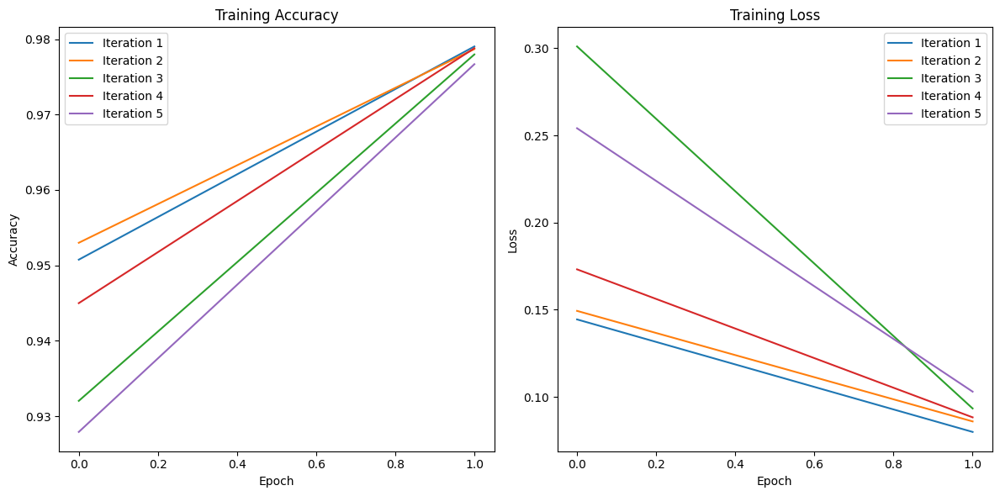

In [ ]:
# Plot training history
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
for i, history in enumerate(training_histories):
    plt.plot(history['accuracy'], label=f'Iteration {i + 1}')
plt.title('Training Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
for i, history in enumerate(training_histories):
    plt.plot(history['loss'], label=f'Iteration {i + 1}')
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

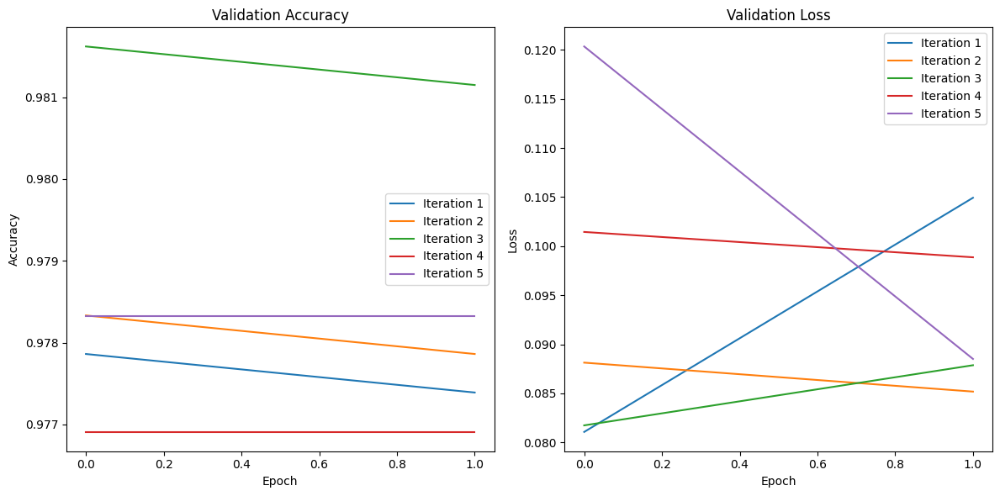

In [ ]:
# Plot validation history
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
for i, history in enumerate(training_histories):
    plt.plot(history['val_accuracy'], label=f'Iteration {i + 1}')
plt.title('Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
for i, history in enumerate(training_histories):
    plt.plot(history['val_loss'], label=f'Iteration {i + 1}')
plt.title('Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


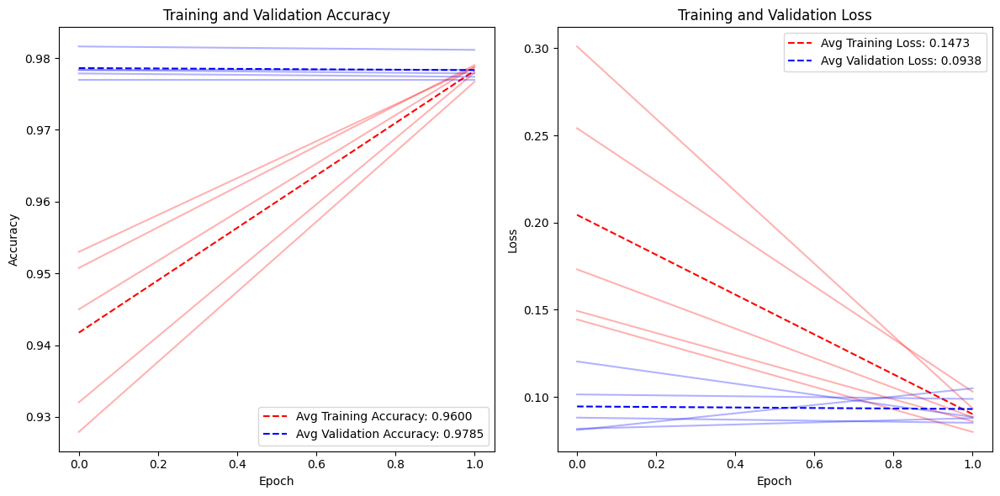

In [ ]:
# Find the maximum length of training histories
max_len = max(len(history['accuracy']) for history in training_histories)

# Pad the shorter histories with NaN values
for history in training_histories:
    history['accuracy'] += [np.nan] * (max_len - len(history['accuracy']))
    history['val_accuracy'] += [np.nan] * (max_len - len(history['val_accuracy']))
    history['loss'] += [np.nan] * (max_len - len(history['loss']))
    history['val_loss'] += [np.nan] * (max_len - len(history['val_loss']))

# Calculate average training history
avg_train_acc = np.mean([history['accuracy'] for history in training_histories], axis=0)
avg_val_acc = np.mean([history['val_accuracy'] for history in training_histories], axis=0)
avg_train_loss = np.mean([history['loss'] for history in training_histories], axis=0)
avg_val_loss = np.mean([history['val_loss'] for history in training_histories], axis=0)

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
for history in training_histories:
    plt.plot(history['accuracy'], color='red', alpha=0.3)  # Red
plt.plot(avg_train_acc, label=f'Avg Training Accuracy: {np.nanmean(avg_train_acc):.4f}', color='red', linestyle='--')
for history in training_histories:
    plt.plot(history['val_accuracy'], color='blue', alpha=0.3)  # Blue
plt.plot(avg_val_acc, label=f'Avg Validation Accuracy: {np.nanmean(avg_val_acc):.4f}', color='blue', linestyle='--')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
for history in training_histories:
    plt.plot(history['loss'], color='red', alpha=0.3)  # Red
plt.plot(avg_train_loss, label=f'Avg Training Loss: {np.nanmean(avg_train_loss):.4f}', color='red', linestyle='--')
for history in training_histories:
    plt.plot(history['val_loss'], color='blue', alpha=0.3)  # Blue
plt.plot(avg_val_loss, label=f'Avg Validation Loss: {np.nanmean(avg_val_loss):.4f}', color='blue', linestyle='--')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


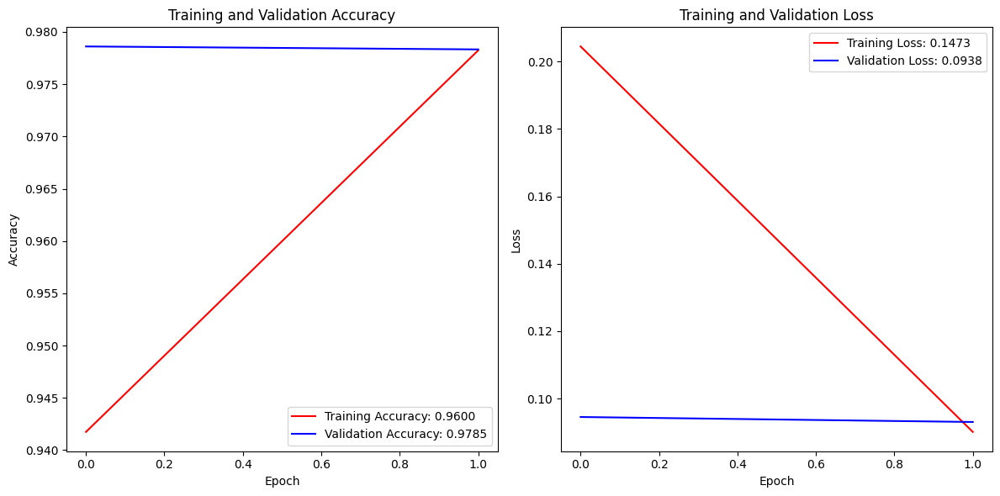

In [ ]:
#Early stopping

# Find the minimum length of training histories
min_len = min(len(history['accuracy']) for history in training_histories)

# Calculate average training history
avg_train_acc = np.mean([np.array(history['accuracy'][:min_len]) for history in training_histories], axis=0)
avg_val_acc = np.mean([np.array(history['val_accuracy'][:min_len]) for history in training_histories], axis=0)
avg_train_loss = np.mean([np.array(history['loss'][:min_len]) for history in training_histories], axis=0)
avg_val_loss = np.mean([np.array(history['val_loss'][:min_len]) for history in training_histories], axis=0)

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(avg_train_acc, label=f'Training Accuracy: {np.mean(avg_train_acc):.4f}', color='red')  # Red
plt.plot(avg_val_acc, label=f'Validation Accuracy: {np.mean(avg_val_acc):.4f}', color='blue')  # Blue
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(avg_train_loss, label=f'Training Loss: {np.mean(avg_train_loss):.4f}', color='red')  # Red
plt.plot(avg_val_loss, label=f'Validation Loss: {np.mean(avg_val_loss):.4f}', color='blue')  # Blue
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

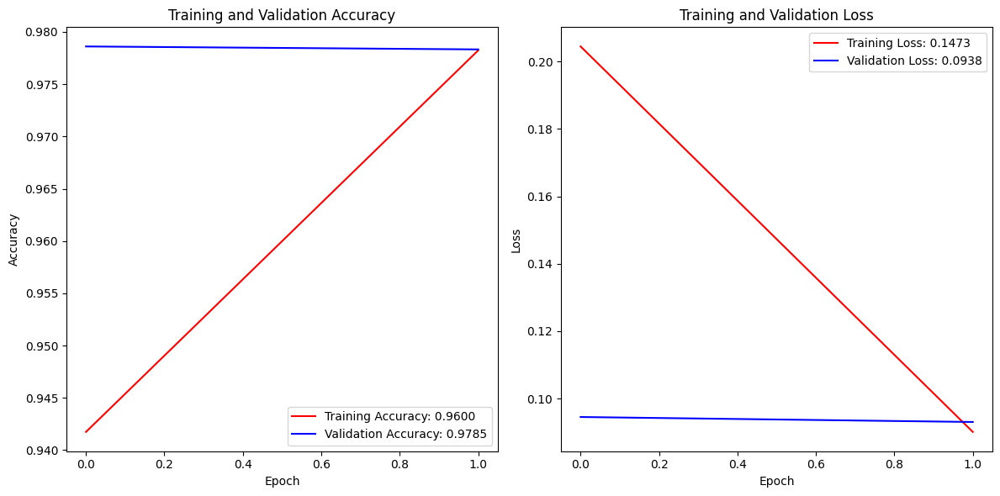

In [ ]:
import numpy as np

# Calculate average training history
avg_train_acc = np.mean([history['accuracy'] for history in training_histories], axis=0)
avg_val_acc = np.mean([history['val_accuracy'] for history in training_histories], axis=0)
avg_train_loss = np.mean([history['loss'] for history in training_histories], axis=0)
avg_val_loss = np.mean([history['val_loss'] for history in training_histories], axis=0)

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(avg_train_acc, label=f'Training Accuracy: {np.mean(avg_train_acc):.4f}', color='red')  # Merah
plt.plot(avg_val_acc, label=f'Validation Accuracy: {np.mean(avg_val_acc):.4f}', color='blue')  # Biru
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(avg_train_loss, label=f'Training Loss: {np.mean(avg_train_loss):.4f}', color='red')  # Merah
plt.plot(avg_val_loss, label=f'Validation Loss: {np.mean(avg_val_loss):.4f}', color='blue')  # Biru
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

# Generate predictions on the test set
y_pred = classifier.predict(np.array(test_images))
y_pred = (y_pred > 0.5).astype(int)

# Calculate confusion matrix
cm = confusion_matrix(np.array(test_labels), y_pred)

# Calculate True Positive (TP), True Negative (TN), False Negative (FN), False Positive (FP)
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]
TP = cm[1, 1]

# Calculate other metrics
Recall = TP / (TP + FN)
Precision = TP / (TP + FP)
ACC = (TP + TN) / (TP + TN + FP + FN)
CSI = TP / (TP + FP + FN)
FAR = FP / (FP + TN)
HSS = 2 * ((TP * TN) - (FP * FN)) / ((TP + FN) * (FN + TN) + (TP + FP) * (FP + TN))
TSS = Recall - FAR

# Print the classification report
print("Classification Report:")
print(classification_report(np.array(test_labels), y_pred))

# Print metrics in a formal table format
print("Metric".ljust(30), "Value")
print("-" * 40)
print(f"True Positive (TP):".ljust(30), TP)
print(f"True Negative (TN):".ljust(30), TN)
print(f"False Positive (FP):".ljust(30), FP)
print(f"False Negative (FN):".ljust(30), FN)
print(f"Recall:".ljust(30), f"{Recall:.4f}")
print(f"Precision:".ljust(30), f"{Precision:.4f}")
print(f"Accuracy (ACC):".ljust(30), f"{ACC:.4f}")
print(f"Critical Success Index (CSI):".ljust(30), f"{CSI:.4f}")
print(f"False Alarm Ratio (FAR):".ljust(30), f"{FAR:.4f}")
print(f"Heidke Skill Score (HSS):".ljust(30), f"{HSS:.4f}")
print(f"True Skill Statistics (TSS):".ljust(30), f"{TSS:.4f}")

67/67 [==============================] - 1s 6ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98      1042
           1       1.00      0.96      0.98      1080

    accuracy                           0.98      2122
   macro avg       0.98      0.98      0.98      2122
weighted avg       0.98      0.98      0.98      2122

Metric                         Value
----------------------------------------
True Positive (TP):            1034
True Negative (TN):            1042
False Positive (FP):           0
False Negative (FN):           46
Recall:                        0.9574
Precision:                     1.0000
Accuracy (ACC):                0.9783
Critical Success Index (CSI):  0.9574
False Alarm Ratio (FAR):       0.0000
Heidke Skill Score (HSS):      0.9567
True Skill Statistics (TSS):   0.9574


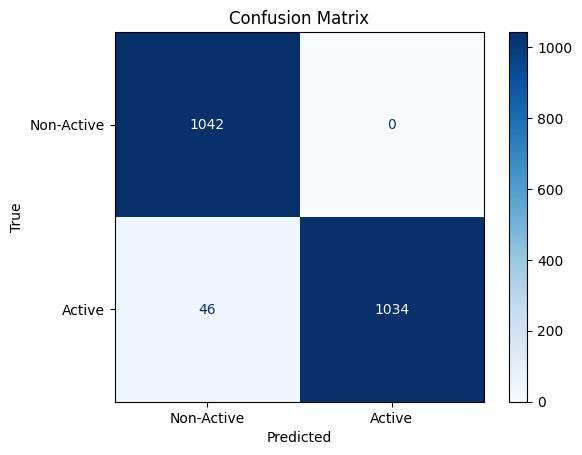

In [ ]:
# Plot confusion matrix
cm = confusion_matrix(np.array(test_labels), y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Active', 'Active'])
disp.plot(cmap='Blues', values_format='d')
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

In [ ]:
# Plotting
plt.figure(figsize=(10, 6))
bars = plt.bar(metrics, values, color=['blue', 'green', 'orange', 'red', 'purple', 'brown', 'pink'])

# Add text labels on each bar
for bar, value in zip(bars, values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.02, f'{value:.2f}', ha='center', va='bottom')

plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Metrics Visualization')
plt.xticks(rotation=45)
plt.show()


NameError: name 'metrics' is not defined

<Figure size 1000x600 with 0 Axes>

Mean Squared Error (MSE): 0.021677662582469368
Mean Absolute Error (MAE): 0.021677662582469368
R-squared (R^2): 0.9132615340868699
AUC-PR: 0.9895425349949384
Cohen's Kappa: 0.9566644232015726
AUC-ROC: 0.9787037037037036


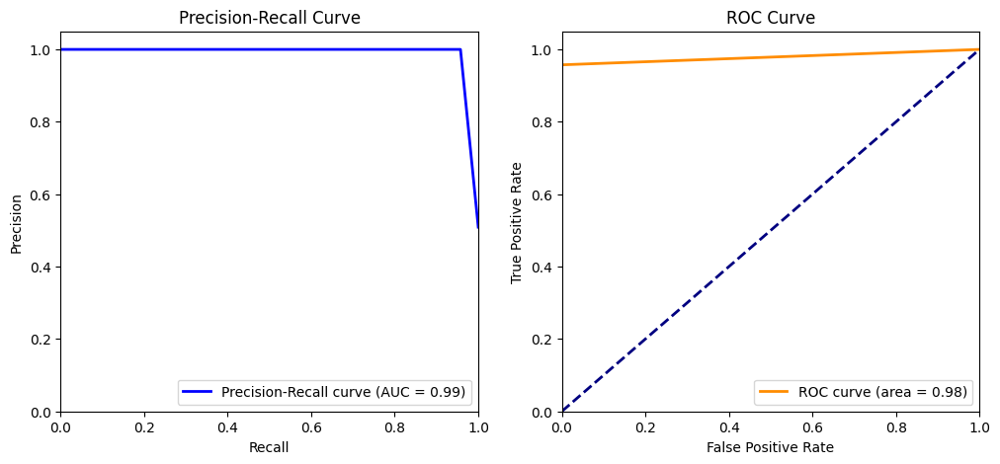

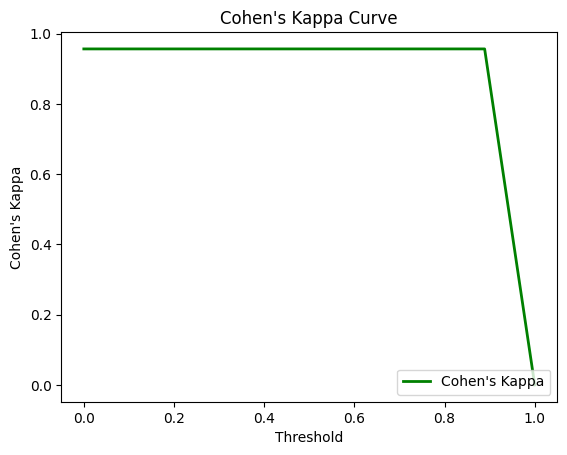

In [ ]:
#Early stopping
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, precision_recall_curve, auc, roc_curve, cohen_kappa_score
import matplotlib.pyplot as plt

# Suppose you have a range of thresholds
thresholds = np.linspace(0, 1, 10)

# Compute Cohen's Kappa for each threshold
kappa_values = [cohen_kappa_score(test_labels, (y_pred > threshold).astype(int)) for threshold in thresholds]

# Menghitung AUC-PR (Area under Precision-Recall Curve) dan Precision-Recall Curve
precision, recall, _ = precision_recall_curve(test_labels, y_pred)
auc_pr = auc(recall, precision)

# Menghitung Cohen's Kappa
kappa = cohen_kappa_score(test_labels, (y_pred > 0.5).astype(int))

# Menghitung AUC-ROC (Area under Receiver Operating Characteristic Curve) dan ROC Curve
fpr, tpr, _ = roc_curve(test_labels, y_pred)
auc_roc = auc(fpr, tpr)

# Menghitung Mean Squared Error (MSE), Mean Absolute Error (MAE), dan R-squared (R^2)
mse = mean_squared_error(test_labels, y_pred)
mae = mean_absolute_error(test_labels, y_pred)
r_squared = r2_score(test_labels, y_pred)

# Plot kurva Precision-Recall
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(recall, precision, color='blue', lw=2, label='Precision-Recall curve (AUC = %0.2f)' % auc_pr)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.legend(loc="lower right")

# Plot kurva ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % auc_roc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")

# Plot kurva Cohen's Kappa
plt.figure()
plt.plot(thresholds, kappa_values, color='green', lw=2, label="Cohen's Kappa")
plt.xlabel('Threshold')
plt.ylabel("Cohen's Kappa")
plt.title("Cohen's Kappa Curve")
plt.legend(loc="lower right")

# Tampilkan hasil metrik
print(f'Mean Squared Error (MSE): {mse}')
print(f'Mean Absolute Error (MAE): {mae}')
print(f'R-squared (R^2): {r_squared}')
print(f'AUC-PR: {auc_pr}')
print(f'Cohen\'s Kappa: {kappa}')
print(f'AUC-ROC: {auc_roc}')

plt.show()


Mean Squared Error (MSE): 0.036372224846480866
Mean Absolute Error (MAE): 0.036372224846480866
R-squared (R^2): 0.8544757398562692
AUC-PR: 0.9718021595425854
Cohen's Kappa: 0.9272217893968449
AUC-ROC: 0.9635084586885685


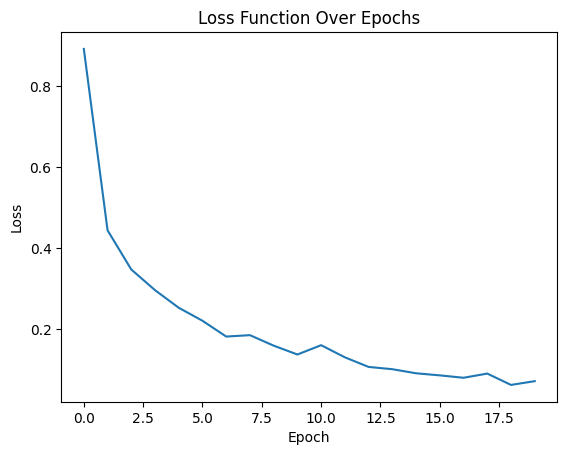

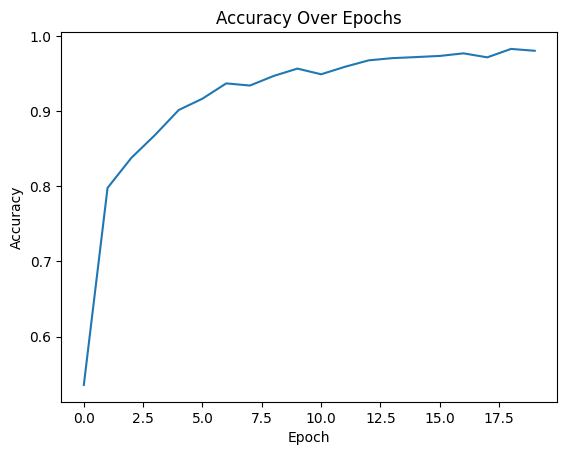

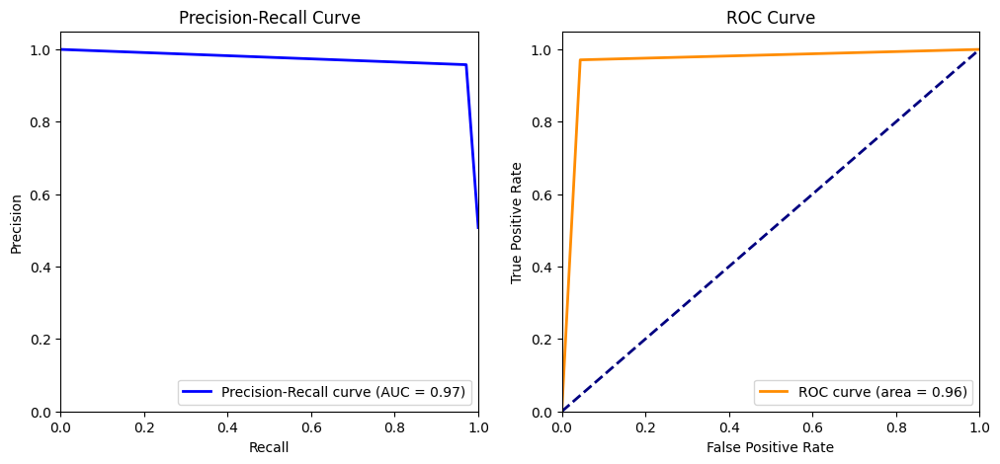

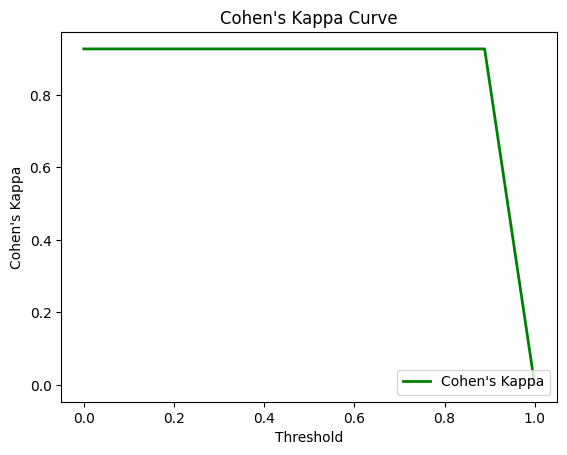

In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, precision_recall_curve, auc, roc_curve, cohen_kappa_score, average_precision_score
import matplotlib.pyplot as plt

# Suppose you have a range of thresholds
thresholds = np.linspace(0, 1, 10)

# Compute Cohen's Kappa for each threshold
kappa_values = [cohen_kappa_score(test_labels, (y_pred > threshold).astype(int)) for threshold in thresholds]

# Menghitung AUC-PR (Area under Precision-Recall Curve) dan Precision-Recall Curve
precision, recall, _ = precision_recall_curve(test_labels, y_pred)
auc_pr = auc(recall, precision)

# Menghitung Cohen's Kappa
kappa = cohen_kappa_score(test_labels, (y_pred > 0.5).astype(int))

# Menghitung AUC-ROC (Area under Receiver Operating Characteristic Curve) dan ROC Curve
fpr, tpr, _ = roc_curve(test_labels, y_pred)
auc_roc = auc(fpr, tpr)

# Menghitung Mean Squared Error (MSE), Mean Absolute Error (MAE), dan R-squared (R^2)
mse = mean_squared_error(test_labels, y_pred)
mae = mean_absolute_error(test_labels, y_pred)
r_squared = r2_score(test_labels, y_pred)

# Memantau Loss Function
plt.figure()
plt.plot(history['loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Function Over Epochs')

# Memantau Akurasi
plt.figure()
plt.plot(history['accuracy'])  # Gantilah dengan nama metrik akurasi yang sesuai dalam objek history Anda
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs')

# Plot kurva Precision-Recall
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(recall, precision, color='blue', lw=2, label='Precision-Recall curve (AUC = %0.2f)' % auc_pr)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.legend(loc="lower right")

# Plot kurva ROC
plt.subplot(1, 2, 2)
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % auc_roc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")

# Plot kurva Cohen's Kappa
plt.figure()
plt.plot(thresholds, kappa_values, color='green', lw=2, label="Cohen's Kappa")
plt.xlabel('Threshold')
plt.ylabel("Cohen's Kappa")
plt.title("Cohen's Kappa Curve")
plt.legend(loc="lower right")

# Tampilkan hasil metrik
print(f'Mean Squared Error (MSE): {mse}')
print(f'Mean Absolute Error (MAE): {mae}')
print(f'R-squared (R^2): {r_squared}')
print(f'AUC-PR: {auc_pr}')
print(f'Cohen\'s Kappa: {kappa}')
print(f'AUC-ROC: {auc_roc}')

plt.show()


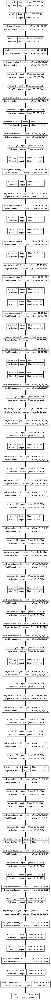

In [ ]:
plot_model(classifier, to_file='MobileNet.png',show_layer_names=True, show_shapes=True) #cgange name's file

In [ ]:
from keras.models import load_model

# Assuming "classifier" is the name of your Keras model
save_model = classifier.to_json()

# Save the model architecture to a JSON file
with open('FL_ResNet.json', 'w') as file:
    file.write(save_model)

# Save the entire model (including weights and optimizer) to a native Keras format file
classifier.save('FL_ResNet.h5')

# Load the model back from the native Keras format file
loaded_model = load_model('ResNet.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Visualisasi Prediksi
# Misalnya, Anda ingin menampilkan 10 contoh prediksi dari data uji
num_examples_to_visualize = 10
for i in range(num_examples_to_visualize):
    sample_index = np.random.randint(0, len(test_labels))
    sample_image = test_images[sample_index]  # Ganti dengan data gambar Anda
    sample_label = test_labels[sample_index]
    model_prediction = y_pred[sample_index]

    plt.figure()
    plt.imshow(sample_image, cmap='gray')  # Ubah cmap sesuai dengan jenis data gambar Anda
    plt.title(f"True Label: {sample_label}, Predicted Label: {model_prediction}")

plt.show()


### **3.2.4. Solar Flare Detection**

In [ ]:
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model

size = 300  # Size of the input images
model_path = '/content/AlexNet_SF.h5'  # Replace with the path to your trained model

# Load the trained model
classifier = load_model(model_path)
S
def preprocess_image(image_path):
    # Read and preprocess a single image
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (size, size))
    img = img.reshape(1, size, size, 1)
    img = img / 255.0  # Normalize pixel values
    return img

def predict_image(image_path):
    # Preprocess the image
    img = preprocess_image(image_path)

    # Make predictions
    prediction = classifier.predict(img)

    # Interpret the prediction
    if prediction[0][0] > 0.5:
        result = 'Flare'
    else:
        result = 'Non-Flare'

    return result

def predict_images_in_folder(folder_path):
    # Predict on all images in the given folder
    predictions = []

    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            image_path = os.path.join(folder_path, filename)
            result = predict_image(image_path)
            predictions.append((filename, result))

    return predictions

In [ ]:
#khusus file

from PIL import Image
import matplotlib.pyplot as plt
abu=[]
# Ganti dengan path ke gambar Anda
image_path = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION/Clean_images_MergedAvailable/gong_magxx_fd_20180204_192103.jpg'
result_single = predict_image(image_path)  # Menambahkan .convert('L') untuk membuatnya skala abu-abu

# Memuat gambar
image = Image.open(image_path)
#abu.append(np.array(new_image.convert('L')))
# Menampilkan gambar
plt.imshow(new_image, cmap='gray')
plt.axis('off')  # Menonaktifkan sumbu koordinat


    # Menampilkan hasilnya
plt.show()

print(f"Image Prediction: {result_single}")

In [ ]:
#khusus folder
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os  # Digunakan untuk iterasi file dalam folder

abu = []

# Lokasi folder yang berisi gambar-gambar
folder_path = '/content/drive/MyDrive/Colab Notebook TA/ACTIVE REGION/Clean_images_MergedAvailable'

# Mendapatkan daftar semua file dalam folder
file_list = os.listdir(folder_path)

for file_name in file_list:
    try:
        # Membangun path lengkap ke gambar
        image_path = os.path.join(folder_path, file_name)

        # Prediksi gambar
        result_single = predict_image(image_path)

        # Memuat gambar
        image = Image.open(image_path)

        # Mengonversi gambar ke skala abu-abu
        #gray_image = image.convert('L')
        #abu.append(np.array(gray_image))  # Menambahkan gambar ke dalam daftar abu

        # Menampilkan gambar skala abu-abu
        plt.imshow(gray_image, cmap='gray')
        plt.axis('off')  # Menonaktifkan sumbu koordinat
        plt.show()  # Menampilkan gambar

        # Mencetak prediksi gambar
        print(f"Image Prediction: {result_single}")
    except Exception as e:
        print(f"Error processing {file_name}: {e}")

In [ ]:
#khusus input file dari komputer
from tensorflow.keras.preprocessing import image
import numpy as np
from google.colab import files

uploaded_image = files.upload()

for path in uploaded_image.keys():
  input_image = image.load_img(path, color_mode = 'grayscale', target_size = (28, 28))
  numerical_values_of_image = image.img_to_array(input_image)
  # expand_dimension = numerical_values_of_image.reshape(-1, 28, 28)
  expand_dimension = np.expand_dims(numerical_values_of_image, axis = 0)
  predicted_value = classifier.predict(expand_dimension)
  argmax_predictions = np.argmax(predicted_value)
  print(argmax_predictions)